In [3]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans

from yellowbrick.cluster import SilhouetteVisualizer
from yellowbrick.cluster import InterclusterDistance
from yellowbrick.cluster import KElbowVisualizer
from sklearn.model_selection import train_test_split
from sklearn import metrics
import time
from scipy import linalg
import matplotlib as mpl
import itertools

import matplotlib.cm as cm

from sklearn.utils import shuffle
from sklearn.utils import check_random_state
from sklearn.cluster import MiniBatchKMeans


## Load Datasets

In [4]:
# upload electric grid dataset
grid = pd.read_csv('Grid Data.csv')
grid.head()

,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,stab,stabf
0,2.959060,3.079885,8.381025,9.780754,3.763085,-0.782604,-1.257395,-1.723086,0.650456,0.859578,0.887445,0.958034,0.055347,unstable
1,9.304097,4.902524,3.047541,1.369357,5.067812,-1.940058,-1.872742,-1.255012,0.413441,0.862414,0.562139,0.781760,-0.005957,stable
2,8.971707,8.848428,3.046479,1.214518,3.405158,-1.207456,-1.277210,-0.920492,0.163041,0.766689,0.839444,0.109853,0.003471,unstable
3,0.716415,7.669600,4.486641,2.340563,3.963791,-1.027473,-1.938944,-0.997374,0.446209,0.976744,0.929381,0.362718,0.028871,unstable
4,3.134112,7.608772,4.943759,9.857573,3.525811,-1.125531,-1.845975,-0.554305,0.797110,0.455450,0.656947,0.820923,0.049860,unstable


In [5]:
### preprocess data

# find missing values
print("Missing Values:\n", grid.isna().sum())

# determine type of each variable
print("\nType of Each Variable:\n", grid.dtypes)

# number of rows and columns
print("\nGrid Dataset has", len(grid), "rows and", len(grid.columns), "columns\n")

# detect outliers and remove if needed
def identify_outliers(column):
    Q1 = np.percentile(column, 25)
    Q3 = np.percentile(column, 75)
    IQR = Q3-Q1
    
    # define upper and lower bounds
    lower = Q1 - 1.5*IQR
    upper = Q3 + 1.5*IQR
    
    # identify outliers
    outliers = (column < lower) | (column > upper)
    return outliers

# select for numeric variables
grid_num = grid.iloc[:,:-1]
# apply outlier function to the numeric columns to detect outliers
grid_outliers = grid_num.apply(identify_outliers)
print("\nOutliers identified using IQR:\n", grid_num[grid_outliers.any(axis=1)])

# remove outlier
grid = grid.drop(6273)
grid.reset_index(drop=True, inplace=True)

# number of rows and columns
print("\nGrid Dataset now has", len(grid), "rows and", len(grid.columns), "columns\n")

Missing Values:
 tau1     0
tau2     0
tau3     0
tau4     0
p1       0
p2       0
p3       0
p4       0
g1       0
g2       0
g3       0
g4       0
stab     0
stabf    0
dtype: int64

Type of Each Variable:
 tau1     float64
tau2     float64
tau3     float64
tau4     float64
p1       float64
p2       float64
p3       float64
p4       float64
g1       float64
g2       float64
g3       float64
g4       float64
stab     float64
stabf     object
dtype: object

Grid Dataset has 10000 rows and 14 columns


Outliers identified using IQR:
           tau1      tau2     tau3      tau4       p1        p2        p3  \
6273  6.698111  7.861157  9.33348  2.433936  1.58259 -0.503865 -0.571522   

            p4        g1        g2        g3        g4      stab  
6273 -0.507202  0.641753  0.868178  0.494277  0.410666  0.056923  

Grid Dataset now has 9999 rows and 14 columns



In [6]:
### preprocess data continued

# encode categorical variables: label encoding
print("Unique values for stabf column:\n", grid['stabf'].unique())
grid['stabf_encoded'] = grid['stabf'].map({'unstable':0, 'stable':1})
grid = grid.drop('stabf',axis=1)



Unique values for stabf column:
 ['unstable' 'stable']


In [7]:
### splitting data into test and train set

from sklearn.model_selection import train_test_split
X = grid.iloc[:,:-1]
y = grid['stabf_encoded']

# scaling: standardization
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(X)

# split data into test and train sets
grid_xtrain, grid_xtest, grid_ytrain, grid_ytest = train_test_split(X, y, test_size = 0.2, random_state = 0)
print("Shape of X_train:", grid_xtrain.shape)
print("Shape of y_train:", grid_ytrain.shape)
print("Shape of X_test:", grid_xtest.shape)
print("Shape of y_test:", grid_ytest.shape)
print('\nFraction of positive examples: %.2f%%' % (y[y == 1].shape[0]/y.shape[0]*100.0))



Shape of X_train: (7999, 13)
Shape of y_train: (7999,)
Shape of X_test: (2000, 13)
Shape of y_test: (2000,)

Fraction of positive examples: 36.20%


In [8]:
## WISCONSIN BREAST CANCER DATASET
from sklearn.datasets import load_breast_cancer
bc = load_breast_cancer()
bc.keys()

dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename', 'data_module'])

In [9]:
wisc_features = pd.DataFrame(bc.data, columns = bc.feature_names)
wisc_target = pd.DataFrame(bc.target, columns=['target'])
wisc_target['target'].value_counts()
# form final dataset
wisc = pd.concat([wisc_features, wisc_target], axis=1)
wisc.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0


In [10]:
### preprocess wisc data

# find missing values
print("Missing Values:\n", wisc.isna().sum())

# determine type of variable
print("\nType of Each Variable:", wisc.dtypes)

# number of rows and columns
print("\nBreast Cancer dataset has", len(wisc), "rows and", len(wisc.columns), "columns.")


Missing Values:
 mean radius                0
mean texture               0
mean perimeter             0
mean area                  0
mean smoothness            0
mean compactness           0
mean concavity             0
mean concave points        0
mean symmetry              0
mean fractal dimension     0
radius error               0
texture error              0
perimeter error            0
area error                 0
smoothness error           0
compactness error          0
concavity error            0
concave points error       0
symmetry error             0
fractal dimension error    0
worst radius               0
worst texture              0
worst perimeter            0
worst area                 0
worst smoothness           0
worst compactness          0
worst concavity            0
worst concave points       0
worst symmetry             0
worst fractal dimension    0
target                     0
dtype: int64

Type of Each Variable: mean radius                float64
mean texture

In [11]:
### split wisconsin dataset into test and train set
X_w = wisc.iloc[:,:-1]
y_w = wisc['target']

# scale 
X_w = scaler.fit_transform(X_w)

# split data into test and train tests
cancer_xtrain, cancer_xtest, cancer_ytrain, cancer_ytest = train_test_split(X_w, y_w, test_size=0.2, random_state=0)

# balance of dataset
print("\nFraction of positive examples: %.2f%%" % (y_w[y_w == 1].shape[0]/y_w.shape[0]**100.0))




Fraction of positive examples: 0.00%


# Part 1: Clustering

## Clustering Algo 1: k-means

In [13]:
# sorts array of distances and returns the top X configurations with shortest distances / highest scores
def SelBest(arr:list, X:int)->list:
    dx=np.argsort(arr)[:X]
    return arr[dx]

# generate silhouette score plots 
def generate_silhouette_score_plot(X, k, model, dataset_name):
    n_clusters=np.arange(2, k)
    sils=[]
    sils_err=[]
    iterations=k
    for n in n_clusters:
        tmp_sil=[]
        for _ in range(iterations):
            clf=model(n).fit(X) 
            labels=clf.predict(X)
            sil=metrics.silhouette_score(X, labels, metric='euclidean')
            tmp_sil.append(sil)
        val=np.mean(SelBest(np.array(tmp_sil), int(iterations/5)))
        err=np.std(tmp_sil)
        sils.append(val)
        sils_err.append(err)
    plt.errorbar(n_clusters, sils, yerr=sils_err)
    plt.title("Silhouette Scores for {}".format(dataset_name), fontsize=20)
    plt.xticks(n_clusters)
    plt.xlabel("Number of Clusters")
    plt.ylabel("Score")

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 1

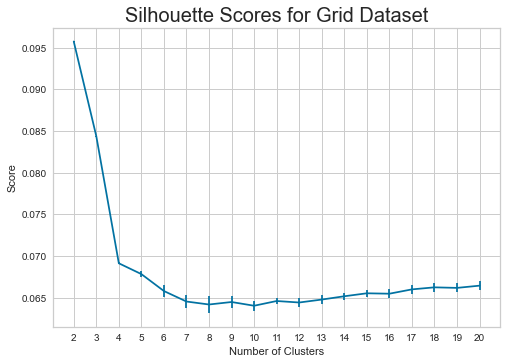

In [22]:
# grid silhouette score
generate_silhouette_score_plot(grid_xtrain, 21, KMeans, dataset_name='Grid Dataset')

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak

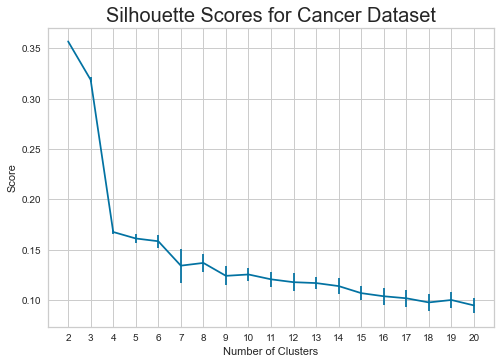

In [23]:
# cancer silhouette score
generate_silhouette_score_plot(cancer_xtrain, 21, KMeans, dataset_name = 'Cancer Dataset')

In [146]:
def generate_SV_ICD(X, k):
    plot_nums = len(k)
    fig, axes = plt.subplots(plot_nums, 2, figsize=[25, 40])
    col_ = 0
    for i in k:
        kmeans = KMeans(n_clusters=i, algorithm="full")
        visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick', ax=axes[col_][0])
        visualizer.fit(X)
        visualizer.finalize()
        
        kmeans = KMeans(n_clusters=i, algorithm="full")
        visualizer = InterclusterDistance(kmeans, ax=axes[col_][1])
        visualizer.fit(X)
        visualizer.finalize()
        
        col_+=1
    plt.show()

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1420: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1420: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\

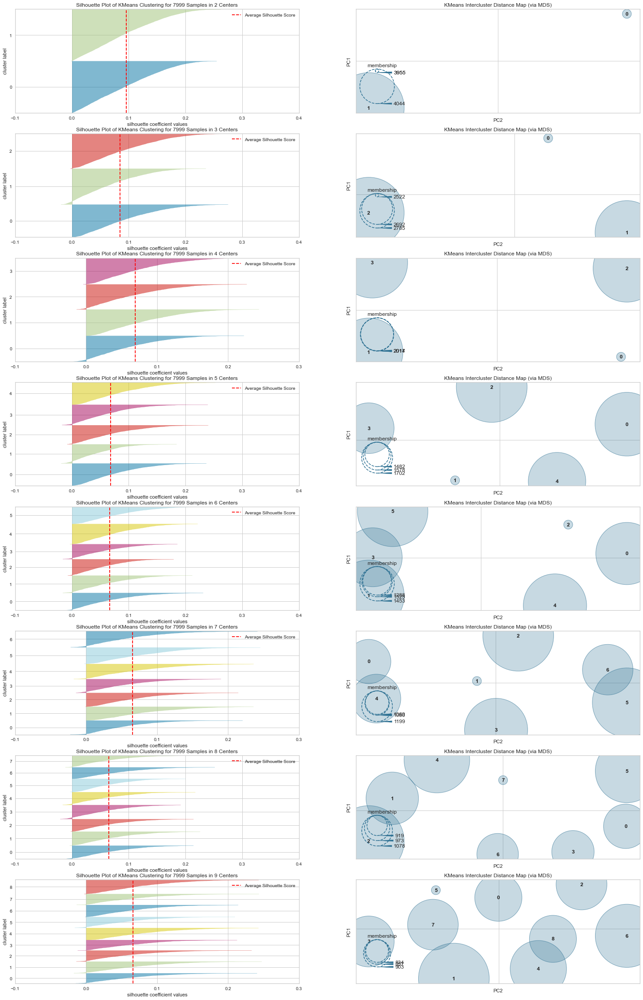

In [25]:
# grid dataset: silhouette visualization and ICD plots
# modify k list range before running!!
k = list(range(2,10))
generate_SV_ICD(grid_xtrain, k)

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1420: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the

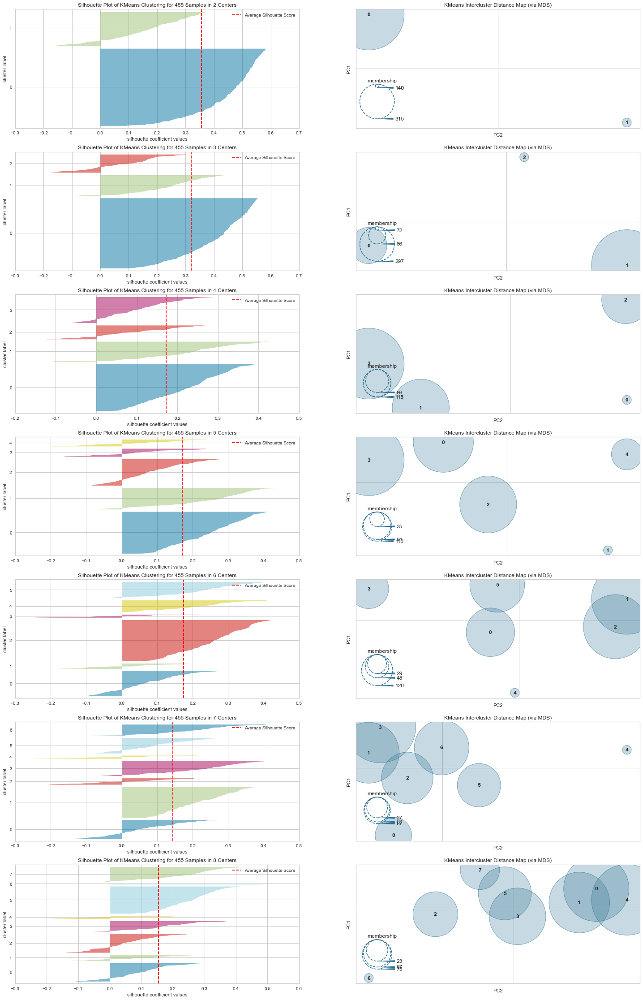

In [26]:
# cancer dataset: silhouette visualization and ICD plots
# modify k list range before running!!
k = list(range(2,9))
generate_SV_ICD(cancer_xtrain, k)

## Clustering Algo 2: Expected Maximization

In [147]:
# grid silhouette score
generate_silhouette_score_plot(grid_xtrain, 21, GaussianMixture, dataset_name = 'Grid Dataset')

KeyboardInterrupt: 

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is k

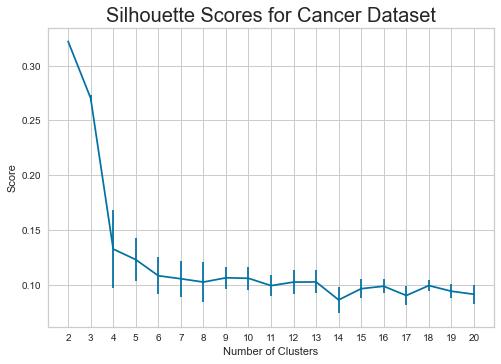

In [28]:
# cancer silhouette score
generate_silhouette_score_plot(cancer_xtrain, 21, GaussianMixture, dataset_name = 'Cancer Dataset')

In [148]:
def gmm_js(gmm_p, gmm_q, n_samples=10**5):    
    X = gmm_p.sample(n_samples)[0]
    log_p_X = gmm_p.score_samples(X)
    log_q_X = gmm_q.score_samples(X)
    log_mix_X = np.logaddexp(log_p_X, log_q_X)

    Y = gmm_q.sample(n_samples)[0]
    log_p_Y = gmm_p.score_samples(Y)
    log_q_Y = gmm_q.score_samples(Y)
    log_mix_Y = np.logaddexp(log_p_Y, log_q_Y)

    return np.sqrt((log_p_X.mean() - (log_mix_X.mean() - np.log(2))
            + log_q_Y.mean() - (log_mix_Y.mean() - np.log(2))) / 2)

# generate plots that depict distance between GMM models
def distance_GMM(train, test, n, dataset_name):    
    n_clusters=np.arange(2, n)
    iterations=n
    results=[]
    res_sigs=[]
    for n in n_clusters:
        dist=[]

        for iteration in range(iterations):
            gmm_train=GaussianMixture(n, n_init=2).fit(train) 
            gmm_test=GaussianMixture(n, n_init=2).fit(test) 
            dist.append(gmm_js(gmm_train, gmm_test))
        selec=SelBest(np.array(dist), int(iterations/5))
        result=np.mean(selec)
        res_sig=np.std(selec)
        results.append(result)
        res_sigs.append(res_sig)


    plt.errorbar(n_clusters, results, yerr=res_sigs)
    plt.title("Distance between Train and Test GMMs for {}".format(dataset_name), fontsize=20)
    plt.xticks(n_clusters)
    plt.xlabel("Number of Components")
    plt.ylabel("Distance")
    plt.show()



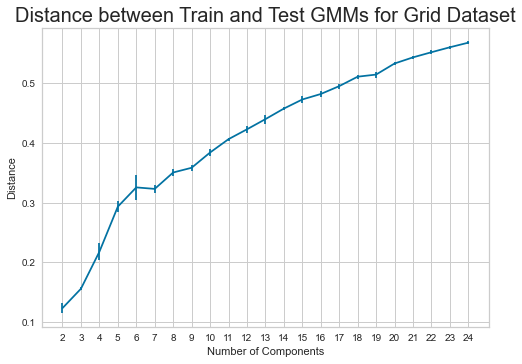

In [34]:
# grid dataset: GMM distance plot
distance_GMM(grid_xtrain, grid_xtest, 25, dataset_name = 'Grid Dataset')


C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is k

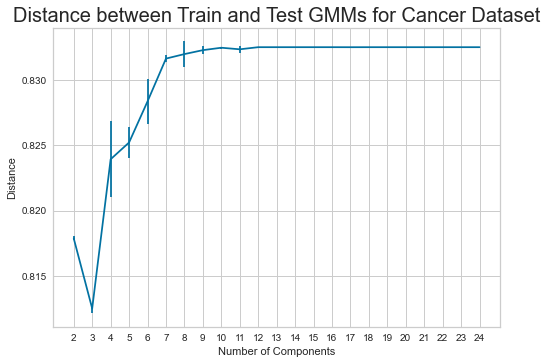

In [36]:
# cancer dataset: GMM distance plot
distance_GMM(cancer_xtrain, cancer_xtest, 25, dataset_name = 'Cancer Dataset')


In [149]:
def bic_plot(X, n, dataset_name):
    n_clusters=np.arange(2, n)
    bics=[]
    bics_err=[]
    iterations=n
    for n in n_clusters:
        tmp_bic=[]
        for _ in range(iterations):
            gmm=GaussianMixture(n, n_init=2).fit(X) 

            tmp_bic.append(gmm.bic(X))
        val=np.mean(SelBest(np.array(tmp_bic), int(iterations/5)))
        err=np.std(tmp_bic)
        bics.append(val)
        bics_err.append(err)

    plt.errorbar(n_clusters,bics, yerr=bics_err, label='BIC')
    plt.title("BIC Scores for {}".format(dataset_name), fontsize=20)
    plt.xticks(n_clusters)
    plt.xlabel("Number of Components")
    plt.ylabel("Score")
    plt.legend()
    plt.show()
    plt.clf()
    
    plt.errorbar(n_clusters, np.gradient(bics), yerr=bics_err, label='BIC')
    plt.title("Gradient of BIC Scores for {}".format(dataset_name), fontsize=20)
    plt.xticks(n_clusters)
    plt.xlabel("Number of Components")
    plt.ylabel("grad(BIC)")
    plt.legend()
    plt.show()
    plt.clf()

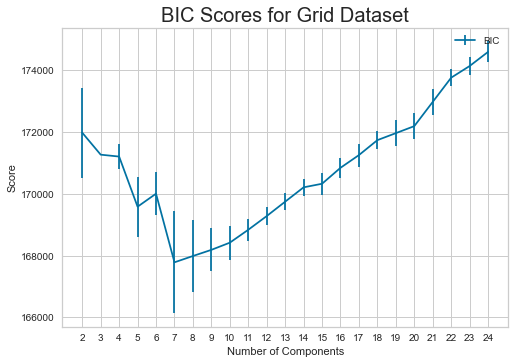

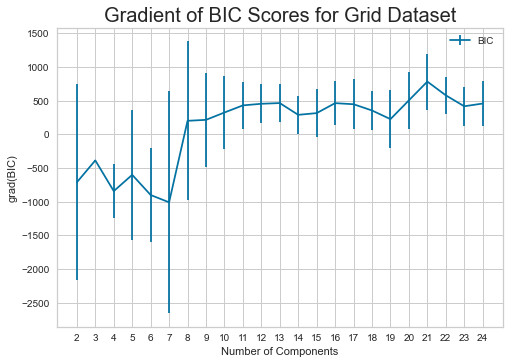

<Figure size 576x396 with 0 Axes>

In [38]:
# grid dataset: BIC plot 
bic_plot(grid_xtrain, 25, dataset_name = 'Grid Dataset')

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is k

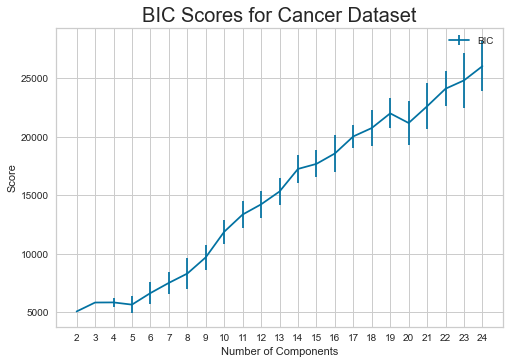

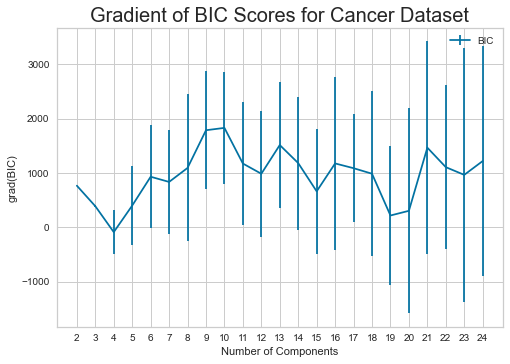

<Figure size 576x396 with 0 Axes>

In [15]:
# cancer dataset: BIC plot 
bic_plot(cancer_xtrain, 25, dataset_name = 'Cancer Dataset')

## Train and Query Times

In [23]:
# time for kmeans - grid dataset
np.random.seed(0)
start = time.time()
kmeans=KMeans(2).fit(grid_xtrain)
train_time = time.time() - start
print("Train time: " + str(train_time))

start = time.time()
kmeans.predict(grid_xtrain)
query_time = time.time() - start
print("Query time: " + str(query_time))

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Train time: 1.7533636093139648
Query time: 0.15750622749328613


In [17]:
# time for kmeans - cancer dataset
start = time.time()
kmeans=KMeans(2).fit(cancer_xtrain)
train_time = time.time() - start
print("Train time: " + str(train_time))

start = time.time()
kmeans.predict(cancer_xtrain)
query_time = time.time() - start
print("Query time: " + str(query_time))

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


Train time: 1.6228880882263184
Query time: 0.1766066551208496


In [18]:
# time for expected maximization - grid dataset
gmm=GaussianMixture(2).fit(grid_xtrain)
train_time = time.time() - start
print("Train time: " + str(train_time))

start = time.time()
gmm.predict(grid_xtrain)
query_time = time.time() - start
print("Query time: " + str(query_time))


Train time: 4.394043684005737
Query time: 0.0


In [19]:
# time for expected maximization - cancer dataset
gmm=GaussianMixture(2).fit(cancer_xtrain)
train_time = time.time() - start
print("Train time: " + str(train_time))

start = time.time()
gmm.predict(cancer_xtrain)
query_time = time.time() - start
print("Query time: " + str(query_time))


Train time: 1.7007203102111816
Query time: 0.0


C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


# Part 2: Dimensionality Reduction

## PCA 

Ideal # of Components: 11


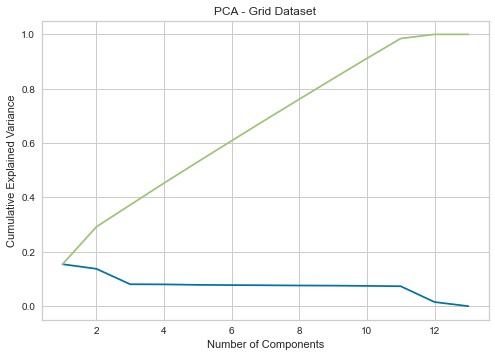

In [72]:
# PCA variance plot - grid 
pca = PCA().fit(grid_xtrain)

# Set cumulative explained variance threshold
threshold = 0.95   

# Calculate the cumulative explained variance
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

# find number of components that meet/exceed threshold
n_components = np.argmax(cumulative_variance >= threshold) + 1
print('Ideal # of Components:', n_components)

plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_)
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title("PCA - Grid Dataset")
plt.show()

In [74]:
start = time.time()
pca = PCA(n_components=11).fit(grid_xtrain)
print("Time(s) " + str(time.time() - start))
print("original shape:", grid_xtrain.shape)
grid_xtrain_pca = pca.transform(grid_xtrain)
print("transformed shape:", grid_xtrain_pca.shape)
print()


Time(s) 0.010314464569091797
original shape: (7999, 13)
transformed shape: (7999, 11)



In [42]:
from sklearn.svm import SVC  
clf = SVC()
cv_score = cross_val_score(clf, grid_xtrain, grid_ytrain, cv=20).mean()
print("Cross validation score: " + str(cv_score))

clf.fit(grid_xtrain, grid_ytrain)
y_pred = clf.predict(grid_xtest)
score = accuracy_score(grid_ytest, y_pred)
print("Test Accuracy: " + str(score))

Cross validation score: 0.9853740601503761
Test Accuracy: 0.987


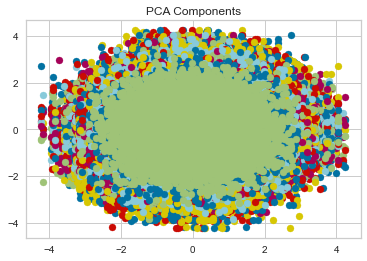

In [75]:
n = 11
pca = PCA(n_components=n) 
X_pca=pca.fit_transform(grid_xtrain)

plt.figure(figsize=(6,4))
plt.title('PCA Components')

for i in range(0, n):
    for j in range(0, n):
        if i == j:
            continue
        plt.scatter(X_pca[:,i], X_pca[:,j])

Ideal # of Components: 10


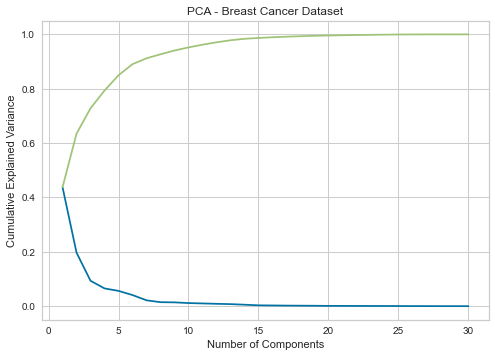

In [73]:
# PCA variance plot - breast cancer 
pca = PCA().fit(cancer_xtrain)

# Set cumulative explained variance threshold
threshold = 0.95   

# Calculate the cumulative explained variance
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

# find number of components that meet/exceed threshold
n_components = np.argmax(cumulative_variance >= threshold) + 1
print('Ideal # of Components:', n_components)

plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_)
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title("PCA - Breast Cancer Dataset")
plt.show()

In [76]:
start = time.time()
pca = PCA(n_components= 10).fit(cancer_xtrain)
print("Time(s) " + str(time.time() - start))
print("original shape:", cancer_xtrain.shape)
X_pca = pca.transform(cancer_xtrain)
print("transformed shape:", X_pca.shape)
print()


Time(s) 0.003989696502685547
original shape: (455, 30)
transformed shape: (455, 10)



In [77]:
cv_score = cross_val_score(clf, cancer_xtrain, cancer_ytrain, cv=20).mean()
print("Cross validation score: " + str(cv_score))

clf.fit(cancer_xtrain, cancer_ytrain)
y_pred = clf.predict(cancer_xtest)
score = accuracy_score(cancer_ytest, y_pred)
print("Test Accuracy: " + str(score))

Cross validation score: 0.9410079051383399
Test Accuracy: 0.9649122807017544


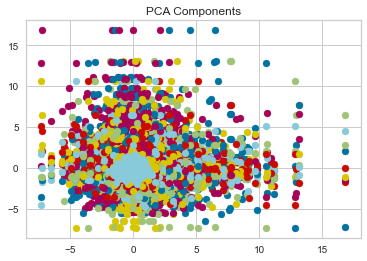

In [78]:
n = 10
pca = PCA(n_components=n) 
X_pca=pca.fit_transform(cancer_xtrain)

plt.figure(figsize=(6,4))
plt.title('PCA Components')

for i in range(0, n):
    for j in range(0, n):
        if i == j:
            continue
        plt.scatter(X_pca[:,i], X_pca[:,j])

## ICA

In [17]:
# ICA - grid dataset
best_n = (0, 0)
for i in range(2, 31):
    ica = FastICA(n_components=i, max_iter=10000, tol=0.1).fit(X)
    X_ica = ica.fit_transform(X)  
    clf = DecisionTreeClassifier(max_depth = 26, min_samples_leaf = 3)
    cv_score = cross_val_score(clf, grid_xtrain, grid_ytrain, cv=20).mean()
    if (cv_score > best_n[1]):
        best_n = (i, cv_score)

clf = DecisionTreeClassifier(max_depth = 26, min_samples_leaf = 3)
print("Best n_components: " + str(best_n[0]))
ica = FastICA(n_components=int(best_n[0]), max_iter=10000, tol=0.1).fit(X)
X_ica = ica.fit_transform(grid_xtrain) 
clf.fit(grid_xtrain, grid_ytrain)
y_pred = clf.predict(grid_xtest)
score = accuracy_score(grid_ytest, y_pred)
print("Test Accuracy: " + str(score))

NameError: name 'FastICA' is not defined

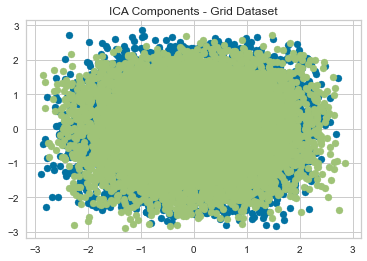

In [195]:
n = 2
ica = FastICA(n_components=n, max_iter=10000, tol=0.1) 
X_ica=ica.fit_transform(grid_xtrain)

plt.figure(figsize=(6,4))
plt.title('ICA Components - Grid Dataset')

for i in range(0, n):
    for j in range(0, n):
        if i == j:
            continue
        plt.scatter(X_ica[:,i], X_ica[:,j])


In [56]:
# ICA - cancer dataset
best_n = (0, 0)
for i in range(2, 31):
    ica = FastICA(n_components=i, max_iter=10000, tol=0.1).fit(cancer_xtrain)
    X_ica = ica.fit_transform(cancer_xtrain)  
    clf = DecisionTreeClassifier(max_depth = 26, min_samples_leaf = 3)
    cv_score = cross_val_score(clf, cancer_xtrain, cancer_ytrain, cv=20).mean()
    if (cv_score > best_n[1]):
        best_n = (i, cv_score)

clf = DecisionTreeClassifier(max_depth = 26, min_samples_leaf = 3)
print("Best n_components: " + str(best_n[0]))
ica = FastICA(n_components=int(best_n[0]), max_iter=10000, tol=0.1).fit(cancer_xtrain)
X_ica = ica.fit_transform(cancer_xtrain) 
clf.fit(cancer_xtrain, cancer_ytrain)
y_pred = clf.predict(cancer_xtest)
score = accuracy_score(cancer_ytest, y_pred)
print("Test Accuracy: " + str(score))

Best n_components: 29
Test Accuracy: 0.9385964912280702


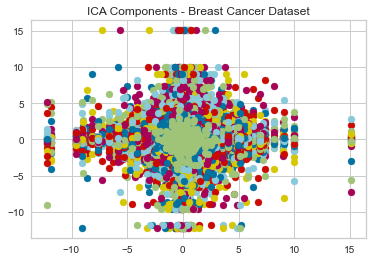

In [196]:
n = 29
ica = FastICA(n_components=n, max_iter=10000, tol=0.1) 
X_ica=ica.fit_transform(cancer_xtrain)

plt.figure(figsize=(6,4))
plt.title('ICA Components - Breast Cancer Dataset')

for i in range(0, n):
    for j in range(0, n):
        if i == j:
            continue
        plt.scatter(X_ica[:,i], X_ica[:,j])


## Randomized Projections

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\random_projection.py:408: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (13 < 20).The dimensionality of the problem will not be reduced.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\random_projection.py:408: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (13 < 30).The dimensionality of the problem will not be reduced.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\random_projection.py:408: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (13 < 40).The dimensionality of the problem will not be reduced.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\random_projection.py:408: DataDimensionalityWarning: The number of components is high

MSE values for each number of components:
N_Comp=10: MSE=125.0546
N_Comp=20: MSE=74.4916
N_Comp=30: MSE=42.3703
N_Comp=40: MSE=42.6525
N_Comp=50: MSE=24.8448
N_Comp=60: MSE=22.1611
N_Comp=70: MSE=21.2416
N_Comp=80: MSE=18.6728
The best number of components is 80 based on MSE.


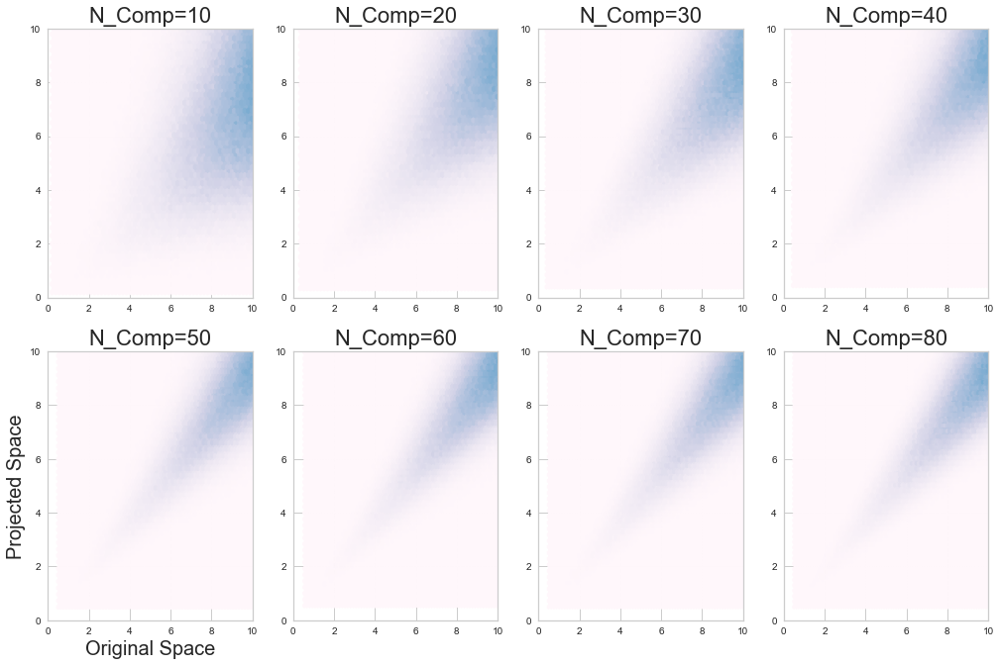

In [8]:
## trying new one RP
from sklearn.metrics.pairwise import euclidean_distances
from sklearn import random_projection

f, ax = plt.subplots(2, 4, figsize=(17, 11))
mse_values = []

for i in range(1, 9):
    n_comp = 10 * i
    transformer = random_projection.GaussianRandomProjection(n_components=n_comp, random_state=42)
    projected_data = transformer.fit_transform(grid_xtrain)

    dists = euclidean_distances(grid_xtrain, squared=True).ravel()
    nonzero = dists != 0
    dists = dists[nonzero]

    projected_dists = euclidean_distances(projected_data, squared=True).ravel()[nonzero]
    min_dist = min(projected_dists.min(), dists.min())
    max_dist = max(projected_dists.max(), dists.max())

    # Calculate the MSE between original and projected distances
    mse = np.mean((dists - projected_dists) ** 2)
    mse_values.append(mse)

    ax[(i - 1) // 4][(i - 1) % 4].hexbin(dists, projected_dists, gridsize=1000, cmap=plt.cm.PuBu,
               extent=[min_dist, max_dist, min_dist, max_dist])
    ax[(i - 1) // 4][(i - 1) % 4].set_title("N_Comp=%d" % n_comp, fontsize=22)
    ax[1][0].set_xlabel("Original Space", fontsize=20)
    ax[1][0].set_ylabel("Projected Space", fontsize=20)
    ax[(i - 1) // 4][(i - 1) % 4].set_xlim(0, 10)
    ax[(i - 1) // 4][(i - 1) % 4].set_ylim(0, 10)

# Find the best number of components with the lowest MSE
best_n_comp = 10 * (np.argmin(mse_values) + 1)

print("MSE values for each number of components:")
for i, mse in enumerate(mse_values):
    print(f"N_Comp={10 * (i + 1)}: MSE={mse:.4f}")

print(f"The best number of components is {best_n_comp} based on MSE.")


C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\random_projection.py:408: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (30 < 40).The dimensionality of the problem will not be reduced.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\random_projection.py:408: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (30 < 50).The dimensionality of the problem will not be reduced.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\random_projection.py:408: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (30 < 60).The dimensionality of the problem will not be reduced.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\random_projection.py:408: DataDimensionalityWarning: The number of components is high

MSE values for each number of components:
N_Comp=10: MSE=1229.2150
N_Comp=20: MSE=446.7027
N_Comp=30: MSE=305.7966
N_Comp=40: MSE=305.3209
N_Comp=50: MSE=274.3480
N_Comp=60: MSE=245.7596
N_Comp=70: MSE=164.2880
N_Comp=80: MSE=118.7903
The best number of components is 80 based on MSE.


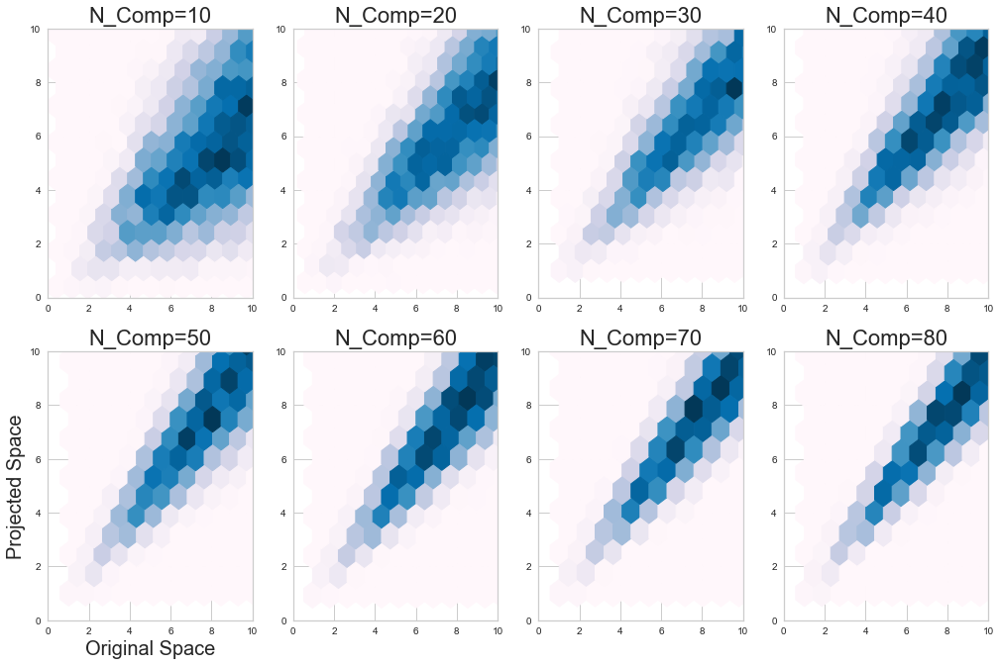

In [14]:
## trying new one RP
from sklearn.metrics.pairwise import euclidean_distances
from sklearn import random_projection

f, ax = plt.subplots(2, 4, figsize=(17, 11))
mse_values = []

for i in range(1, 9):
    n_comp = 10 * i
    transformer = random_projection.GaussianRandomProjection(n_components=n_comp, random_state=42)
    projected_data = transformer.fit_transform(cancer_xtrain)

    dists = euclidean_distances(cancer_xtrain, squared=True).ravel()
    nonzero = dists != 0
    dists = dists[nonzero]

    projected_dists = euclidean_distances(projected_data, squared=True).ravel()[nonzero]
    min_dist = min(projected_dists.min(), dists.min())
    max_dist = max(projected_dists.max(), dists.max())

    # Calculate the MSE between original and projected distances
    mse = np.mean((dists - projected_dists) ** 2)
    mse_values.append(mse)

    ax[(i - 1) // 4][(i - 1) % 4].hexbin(dists, projected_dists, gridsize=1000, cmap=plt.cm.PuBu,
               extent=[min_dist, max_dist, min_dist, max_dist])
    ax[(i - 1) // 4][(i - 1) % 4].set_title("N_Comp=%d" % n_comp, fontsize=22)
    ax[1][0].set_xlabel("Original Space", fontsize=20)
    ax[1][0].set_ylabel("Projected Space", fontsize=20)
    ax[(i - 1) // 4][(i - 1) % 4].set_xlim(0, 10)
    ax[(i - 1) // 4][(i - 1) % 4].set_ylim(0, 10)

# Find the best number of components with the lowest MSE
best_n_comp = 10 * (np.argmin(mse_values) + 1)

print("MSE values for each number of components:")
for i, mse in enumerate(mse_values):
    print(f"N_Comp={10 * (i + 1)}: MSE={mse:.4f}")

print(f"The best number of components is {best_n_comp} based on MSE.")


## SVD

12

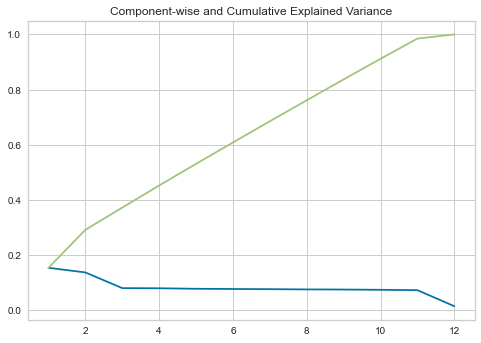

In [63]:
# SVD - grid dataset

tsvd = TruncatedSVD(n_components=grid_xtrain.shape[1]-1)
X_tsvd = tsvd.fit(grid_xtrain)

tsvd_var_ratios = tsvd.explained_variance_ratio_
plt.plot(range(1, len(tsvd_var_ratios) + 1), tsvd_var_ratios)
plt.plot(range(1, len(tsvd_var_ratios) + 1), np.cumsum(tsvd_var_ratios))
plt.title("Component-wise and Cumulative Explained Variance")

# Create a function
def select_n_components(var_ratio, goal_var: float) -> int:
    # Set initial variance explained so far
    total_variance = 0.0
    
    # Set initial number of features
    n_components = 0
    
    # For the explained variance of each feature:
    for explained_variance in var_ratio:
        
        # Add the explained variance to the total
        total_variance += explained_variance
        
        # Add one to the number of components
        n_components += 1
        
        # If we reach our goal level of explained variance
        if total_variance >= goal_var:
            # End the loop
            break
            
    # Return the number of components
    return n_components

select_n_components(tsvd_var_ratios, 0.99)

In [66]:
svd = TruncatedSVD(n_components=12).fit(grid_xtrain)
X_svd = svd.fit_transform(grid_xtrain)
cv_score = cross_val_score(clf, grid_xtrain, grid_ytrain, cv=20).mean()
print("Cross validation score: " + str(cv_score))

clf.fit(grid_xtrain, grid_ytrain)
y_pred = clf.predict(grid_xtest)
score = accuracy_score(grid_ytest, y_pred)
print("Test Accuracy: " + str(score))

Cross validation score: 1.0
Test Accuracy: 0.9995


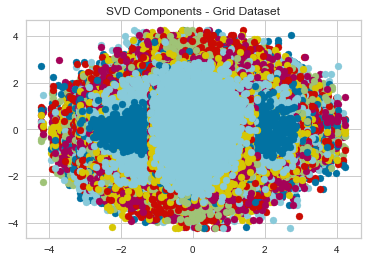

In [197]:
n = 12
svd = TruncatedSVD(n_components=n)
X_svd=svd.fit_transform(grid_xtrain)

plt.figure(figsize=(6,4))
plt.title('SVD Components - Grid Dataset')

for i in range(0, n):
    for j in range(0, n):
        if i == j:
            continue
        plt.scatter(X_svd[:,i], X_svd[:,j])

17

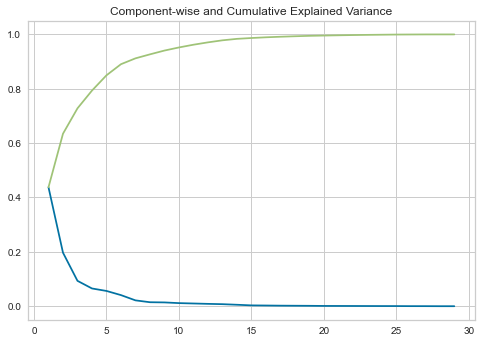

In [68]:
# SVD - cancer dataset

tsvd = TruncatedSVD(n_components=cancer_xtrain.shape[1]-1)
X_tsvd = tsvd.fit(cancer_xtrain)

tsvd_var_ratios = tsvd.explained_variance_ratio_
plt.plot(range(1, len(tsvd_var_ratios) + 1), tsvd_var_ratios)
plt.plot(range(1, len(tsvd_var_ratios) + 1), np.cumsum(tsvd_var_ratios))
plt.title("Component-wise and Cumulative Explained Variance")

# Create a function
def select_n_components(var_ratio, goal_var: float) -> int:
    # Set initial variance explained so far
    total_variance = 0.0
    
    # Set initial number of features
    n_components = 0
    
    # For the explained variance of each feature:
    for explained_variance in var_ratio:
        
        # Add the explained variance to the total
        total_variance += explained_variance
        
        # Add one to the number of components
        n_components += 1
        
        # If we reach our goal level of explained variance
        if total_variance >= goal_var:
            # End the loop
            break
            
    # Return the number of components
    return n_components

select_n_components(tsvd_var_ratios, 0.99)

In [69]:
svd = TruncatedSVD(n_components=17).fit(cancer_xtrain)
X_svd = svd.fit_transform(cancer_xtrain)
cv_score = cross_val_score(clf, cancer_xtrain, cancer_ytrain, cv=20).mean()
print("Cross validation score: " + str(cv_score))

clf.fit(cancer_xtrain, cancer_ytrain)
y_pred = clf.predict(cancer_xtest)
score = accuracy_score(cancer_ytest, y_pred)
print("Test Accuracy: " + str(score))

Cross validation score: 0.9454545454545455
Test Accuracy: 0.9385964912280702


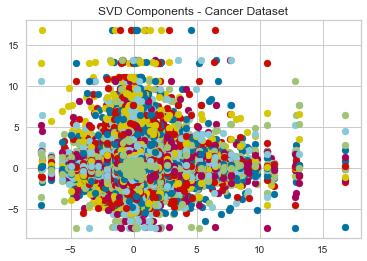

In [198]:
n = 17
svd = TruncatedSVD(n_components=n)
X_svd=svd.fit_transform(cancer_xtrain)

plt.figure(figsize=(6,4))
plt.title('SVD Components - Cancer Dataset')

for i in range(0, n):
    for j in range(0, n):
        if i == j:
            continue
        plt.scatter(X_svd[:,i], X_svd[:,j])

### Part 3: Reproduce clustering experiments on data with dimensionality reduction

## KMeans

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 1

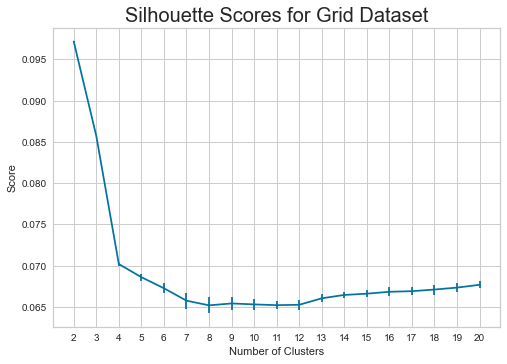

In [81]:
# PCA + kmeans - grid dataset
pca_grid = PCA(n_components = 11).fit(grid_xtrain)
X_pca = pca_grid.transform(grid_xtrain)
generate_silhouette_score_plot(X_pca, 21, KMeans, dataset_name = 'Grid Dataset')

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1420: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1420: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\

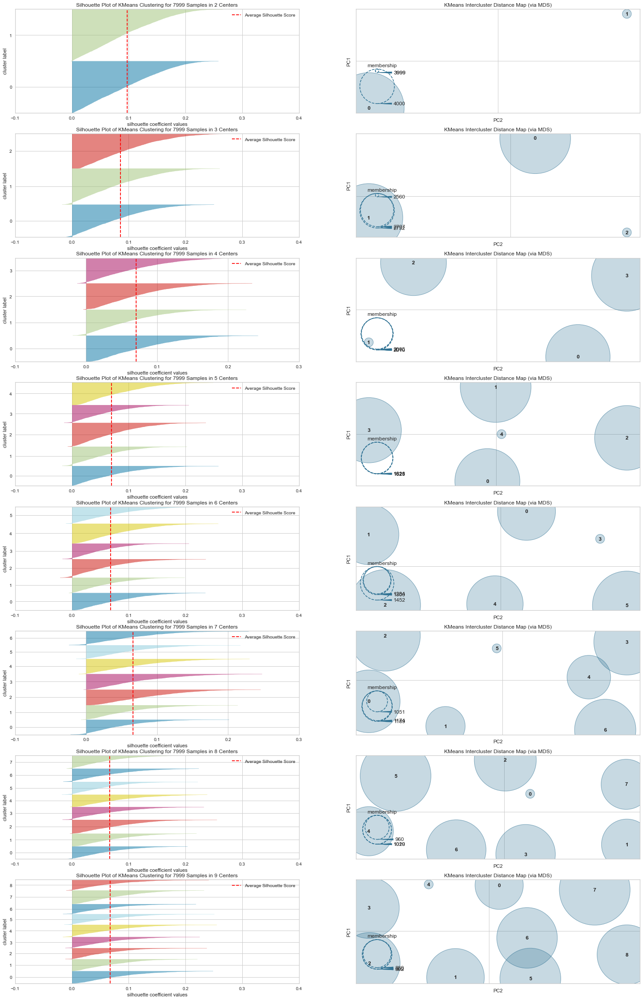

In [84]:
k = list(range(2,10))
generate_SV_ICD(X_pca, k)

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak

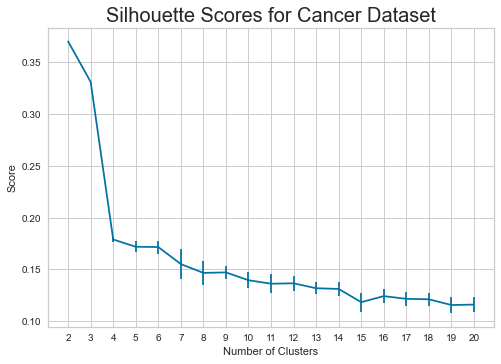

In [85]:
# PCA + kmeans - CANCER dataset
pca_grid = PCA(n_components = 10).fit(cancer_xtrain)
X_pca = pca_grid.transform(cancer_xtrain)
generate_silhouette_score_plot(X_pca, 21, KMeans, dataset_name = 'Cancer Dataset')

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1420: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the

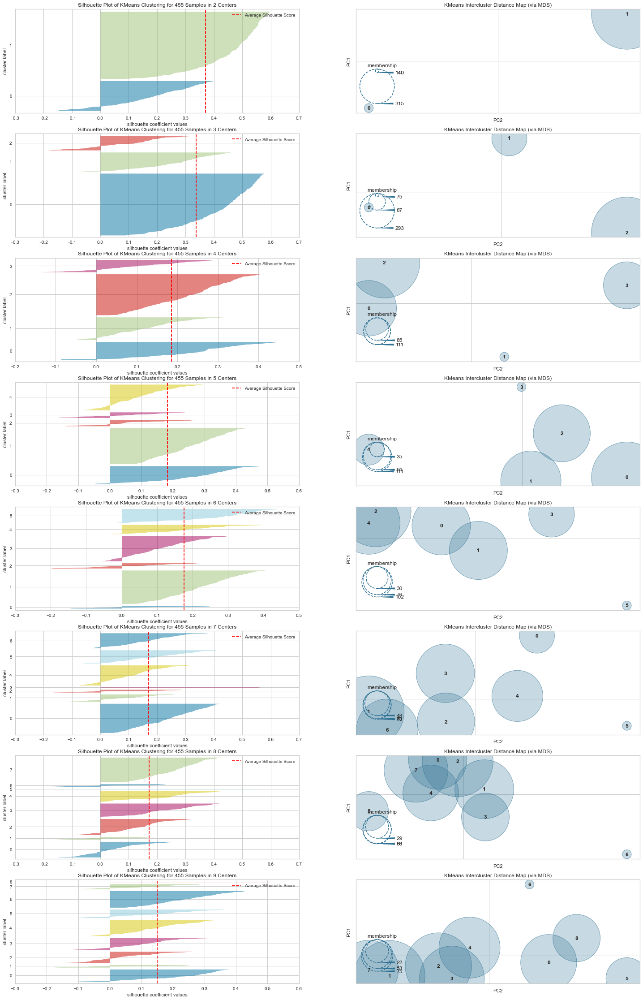

In [86]:
k = list(range(2,10))
generate_SV_ICD(X_pca, k)

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 1

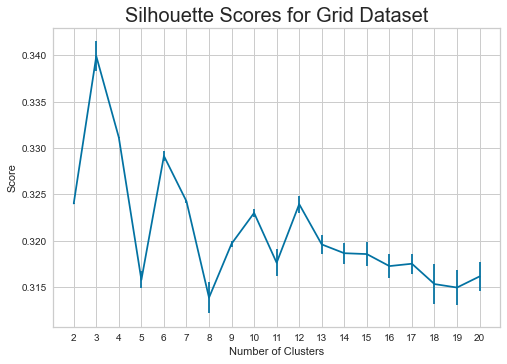

In [95]:
# kmeans + ICA - grid dataset
ica = FastICA(n_components= 2, max_iter=10000, tol=0.1).fit(grid_xtrain)
X_ica = ica.transform(grid_xtrain)
generate_silhouette_score_plot(X_ica, 21, KMeans, dataset_name = 'Grid Dataset')


C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1420: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1420: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\

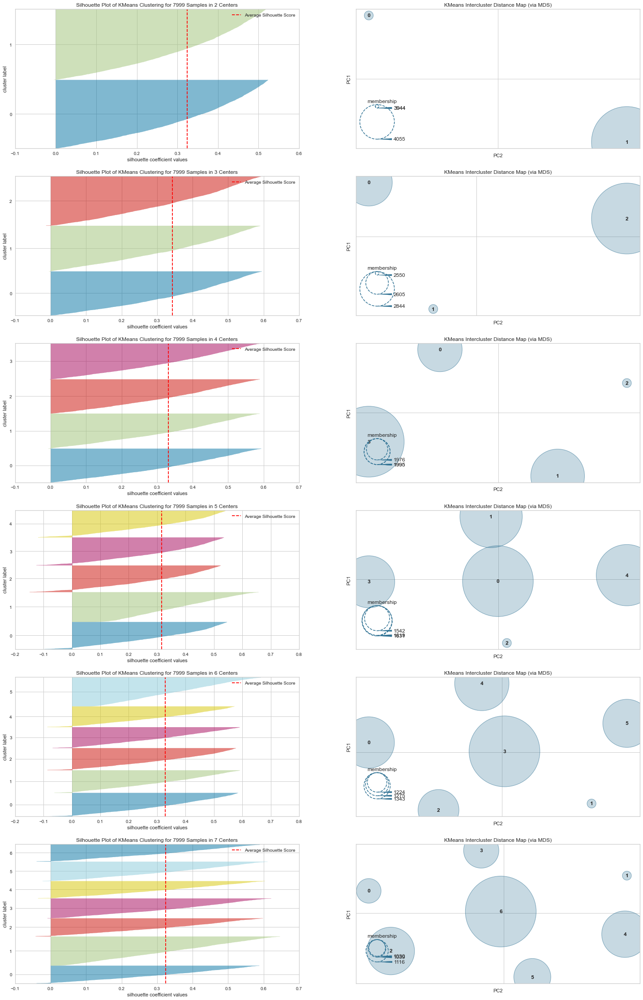

In [96]:
k = list(range(2,8))
generate_SV_ICD(X_ica, k)

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak

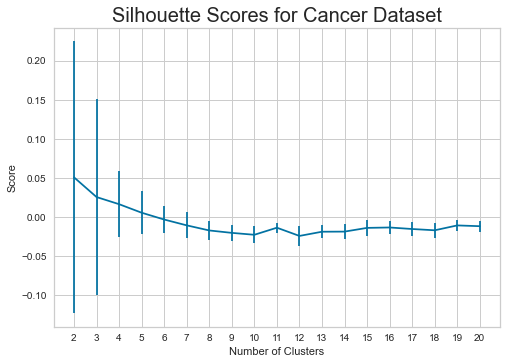

In [97]:
# kmeans + ICA - cancer dataset
ica = FastICA(n_components= 29, max_iter=10000, tol=0.1).fit(cancer_xtrain)
X_ica = ica.transform(cancer_xtrain)
generate_silhouette_score_plot(X_ica, 21, KMeans, dataset_name = 'Cancer Dataset')


C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1420: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the

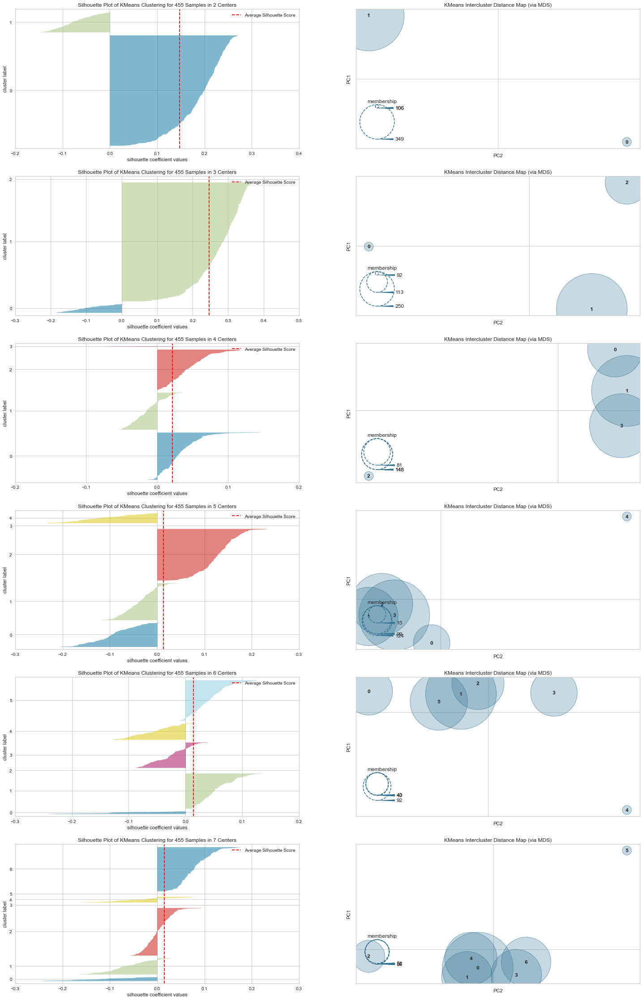

In [98]:
k = list(range(2,8))
generate_SV_ICD(X_ica, k)

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\random_projection.py:408: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (13 < 80).The dimensionality of the problem will not be reduced.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 

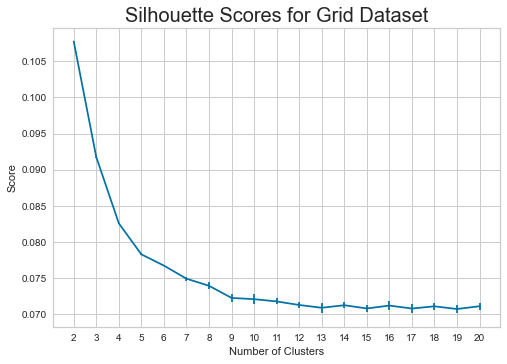

In [17]:
# kmeans + randomized projection - grid dataset
rp = random_projection.SparseRandomProjection(n_components=80)
X_rp=rp.fit_transform(grid_xtrain)
generate_silhouette_score_plot(X_rp, 21, KMeans, dataset_name = 'Grid Dataset')


C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1420: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1420: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\

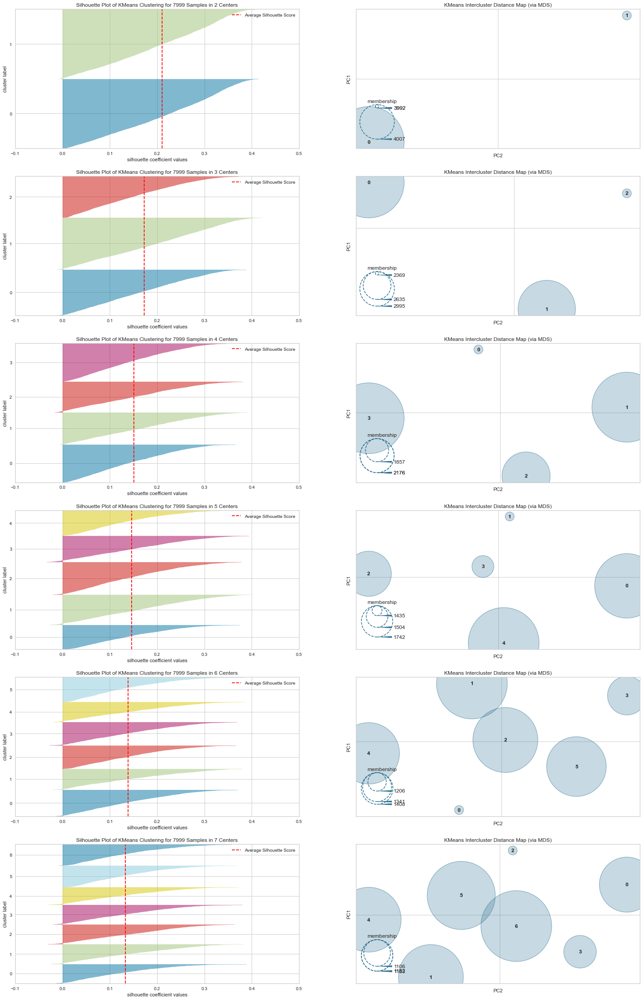

In [101]:
k = list(range(2,8))
generate_SV_ICD(X_rp, k)

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\random_projection.py:408: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (30 < 80).The dimensionality of the problem will not be reduced.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will

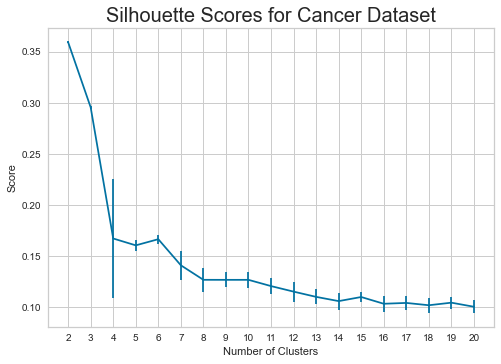

In [18]:
# kmeans + randomized projection - cancer dataset
rp = random_projection.SparseRandomProjection(n_components=80)
X_rp=rp.fit_transform(cancer_xtrain)
generate_silhouette_score_plot(X_rp, 21, KMeans, dataset_name = 'Cancer Dataset')


In [19]:
k = list(range(2,8))
generate_SV_ICD(X_rp, k)

NameError: name 'generate_SV_ICD' is not defined

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 1

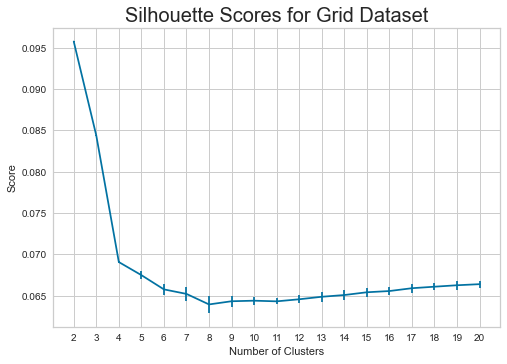

In [107]:
# kmeans + SVD - grid dataset
tsvd = TruncatedSVD(n_components=12)
X_tsvd = tsvd.fit_transform(grid_xtrain)
generate_silhouette_score_plot(X_tsvd, 21, KMeans, dataset_name = 'Grid Dataset')

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1420: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1420: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\

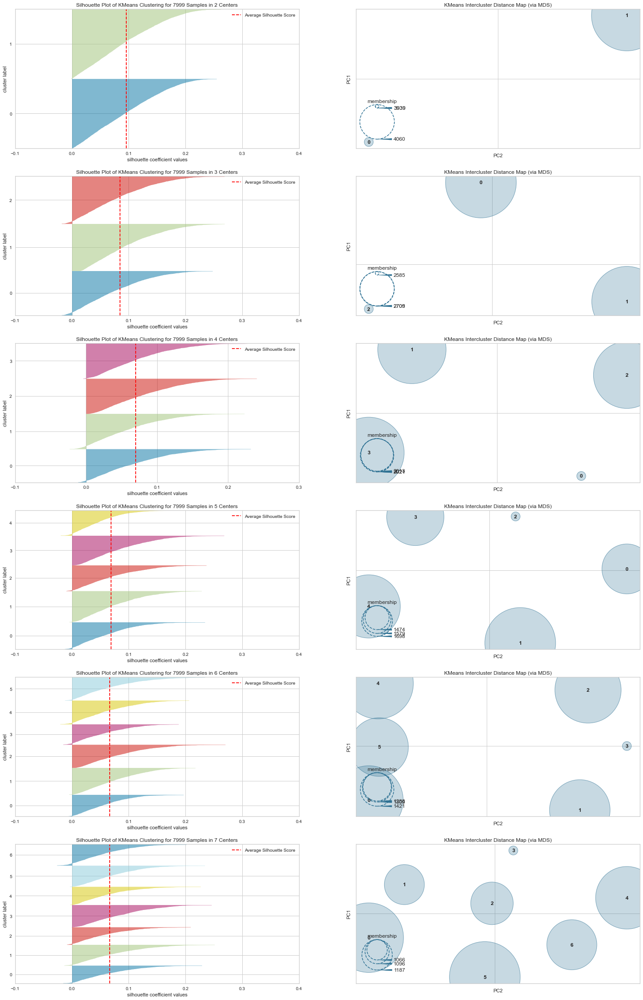

In [108]:
k = list(range(2,8))
generate_SV_ICD(X_tsvd, k)

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak

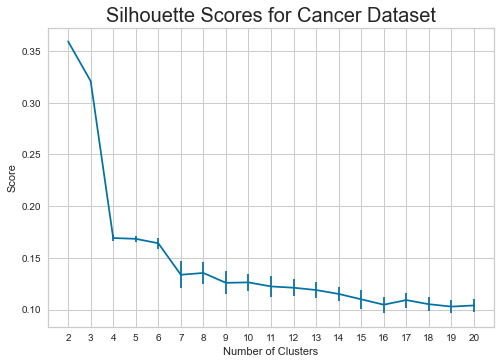

In [109]:
# kmeans + SVD - cancer dataset
tsvd = TruncatedSVD(n_components=17)
X_tsvd = tsvd.fit_transform(cancer_xtrain)
generate_silhouette_score_plot(X_tsvd, 21, KMeans, dataset_name = 'Cancer Dataset')

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1420: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the

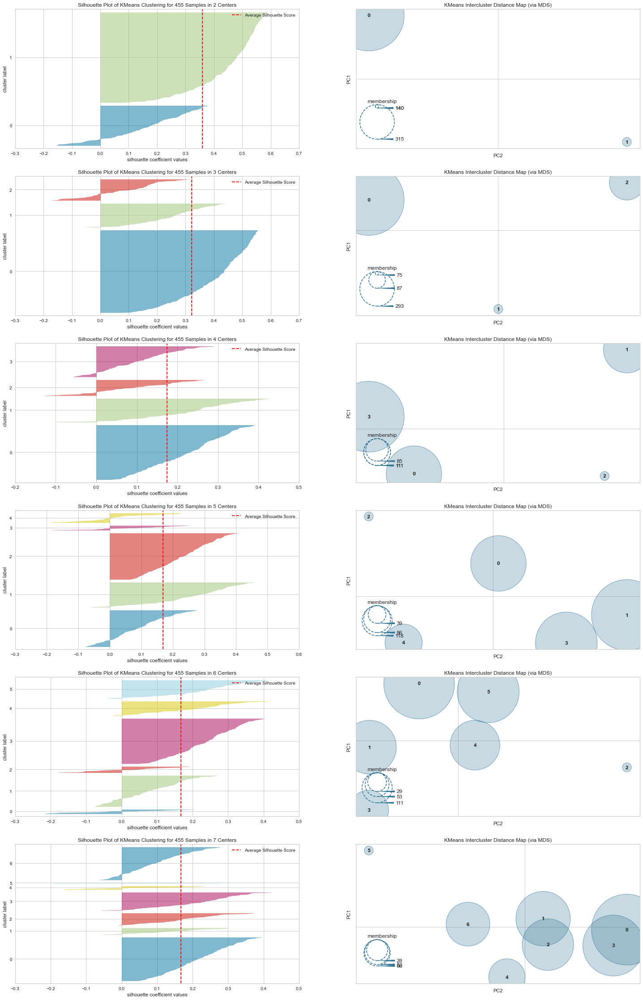

In [110]:
k = list(range(2,8))
generate_SV_ICD(X_tsvd, k)

## Expected Maximization

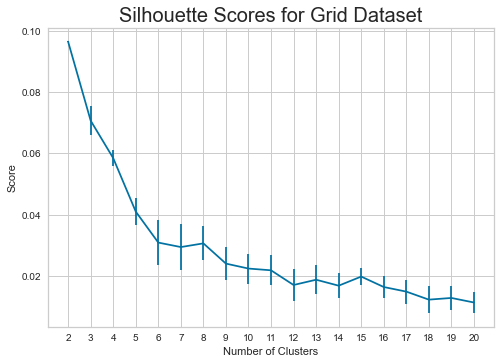

In [111]:
# exp max + pca - grid
pca = PCA(n_components= 11).fit(grid_xtrain)
X_pca = pca.transform(grid_xtrain)
generate_silhouette_score_plot(X_pca, 21, GaussianMixture, dataset_name = 'Grid Dataset')


In [116]:
distance_GMM(X_pca, grid_xtest, 25, dataset_name = 'Grid Dataset')


ValueError: X has 11 features, but GaussianMixture is expecting 13 features as input.

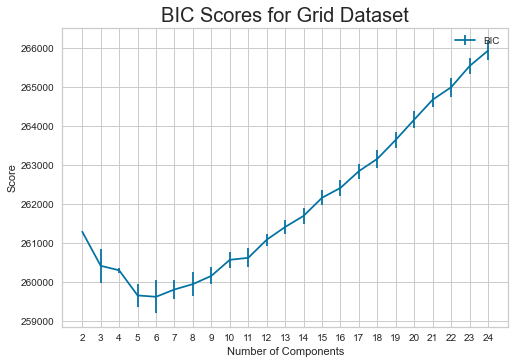

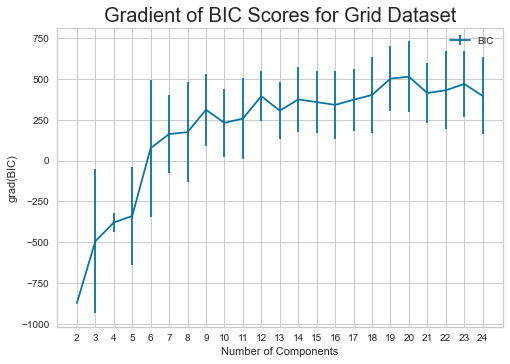

<Figure size 576x396 with 0 Axes>

In [117]:
bic_plot(X_pca, 25, dataset_name = 'Grid Dataset')


C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is k

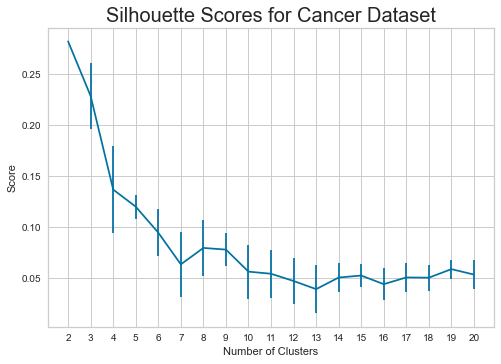

In [118]:
# exp max + pca - cancer
pca = PCA(n_components= 10).fit(cancer_xtrain)
X_pca = pca.transform(cancer_xtrain)
generate_silhouette_score_plot(X_pca, 21, GaussianMixture, dataset_name = 'Cancer Dataset')


In [119]:
distance_GMM(X_pca, 25, dataset_name = 'Cancer Dataset')


TypeError: distance_GMM() missing 1 required positional argument: 'n'

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is k

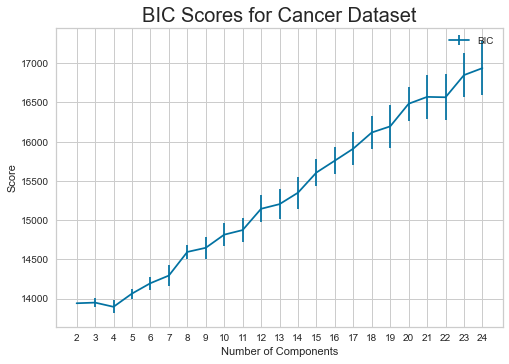

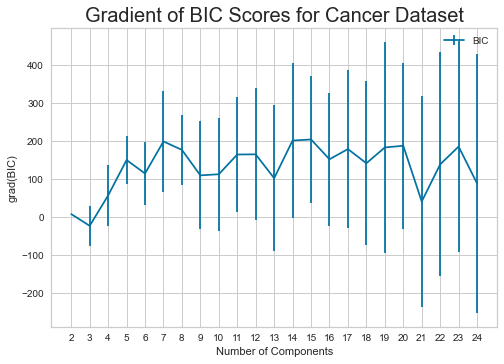

<Figure size 576x396 with 0 Axes>

In [120]:
bic_plot(X_pca, 25, dataset_name = 'Cancer Dataset')


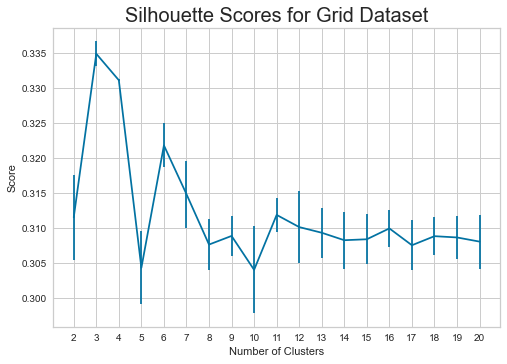

In [121]:
# exp max + ICA - grid
ica = FastICA(n_components= 2, max_iter=10000, tol=0.1).fit(grid_xtrain)
X_ica = ica.transform(grid_xtrain)
generate_silhouette_score_plot(X_ica, 21, GaussianMixture, dataset_name = 'Grid Dataset')


In [ ]:
distance_GMM(X_ica, 25, dataset_name = 'Grid Dataset')


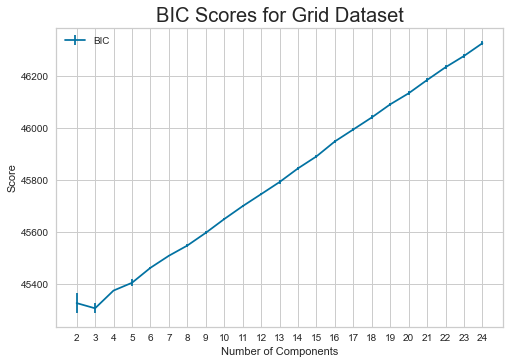

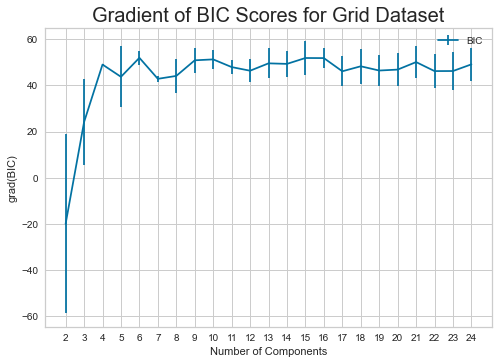

<Figure size 576x396 with 0 Axes>

In [122]:
bic_plot(X_ica, 25, dataset_name = 'Grid Dataset')


C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is k

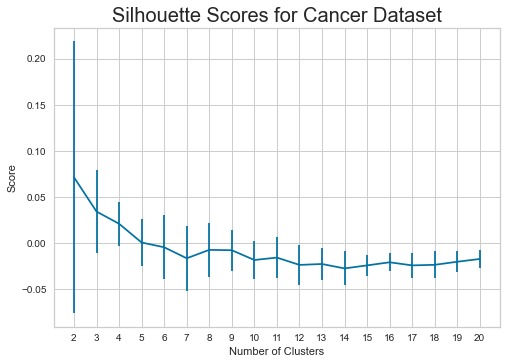

In [123]:
# exp max + ICA - cancer
ica = FastICA(n_components= 29, max_iter=10000, tol=0.1).fit(cancer_xtrain)
X_ica = ica.transform(cancer_xtrain)
generate_silhouette_score_plot(X_ica, 21, GaussianMixture, dataset_name = 'Cancer Dataset')


In [ ]:
distance_GMM(X_ica, 25, dataset_name = 'Cancer Dataset')


C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is k

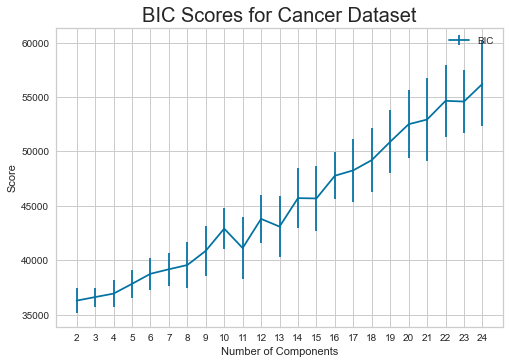

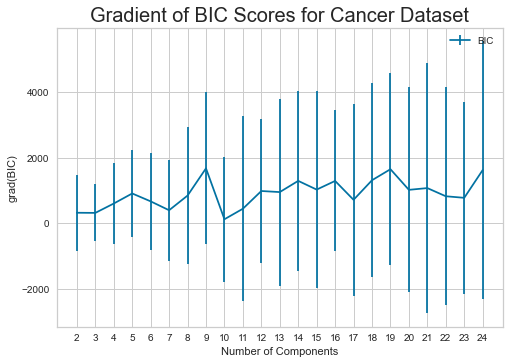

<Figure size 576x396 with 0 Axes>

In [124]:
bic_plot(X_ica, 25, dataset_name = 'Cancer Dataset')


C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\random_projection.py:408: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (13 < 80).The dimensionality of the problem will not be reduced.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\mixture\_base.py:268: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(


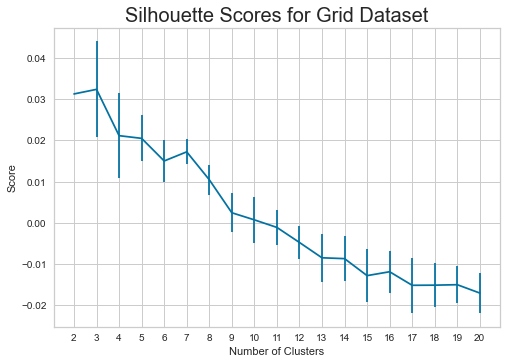

In [14]:
# exp max + rand project - grid dataset
from sklearn import random_projection

rp = random_projection.SparseRandomProjection(n_components=80)
X_rp=rp.fit_transform(grid_xtrain)
generate_silhouette_score_plot(X_rp, 21, GaussianMixture, dataset_name = 'Grid Dataset')


In [ ]:
distance_GMM(X_rp, 25, dataset_name = 'Grid Dataset')


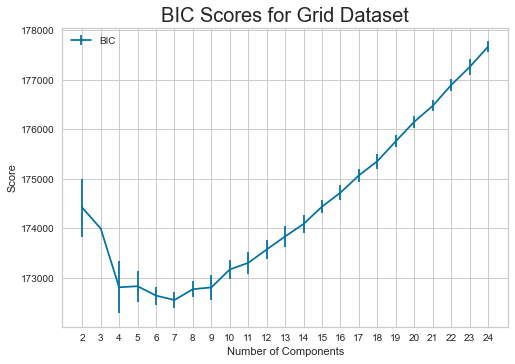

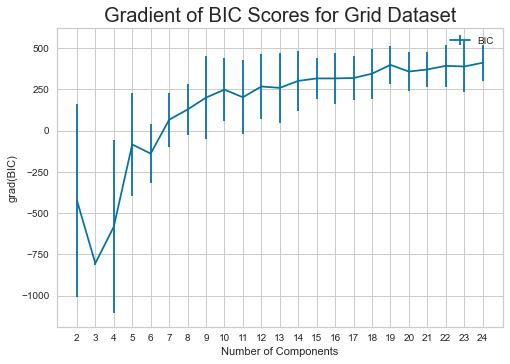

<Figure size 576x396 with 0 Axes>

In [126]:
bic_plot(X_rp, 25, dataset_name = 'Grid Dataset')


C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\random_projection.py:408: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (30 < 80).The dimensionality of the problem will not be reduced.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have

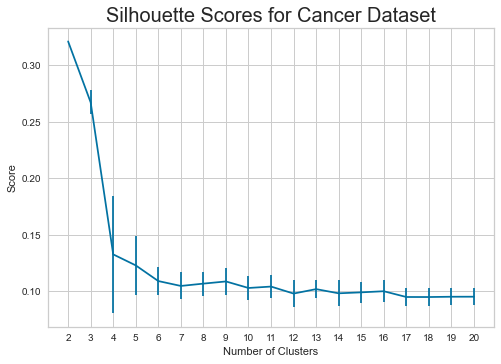

In [15]:
# exp max + rand project - cancer dataset
rp = random_projection.SparseRandomProjection(n_components=80)
X_rp=rp.fit_transform(cancer_xtrain)
generate_silhouette_score_plot(X_rp, 21, GaussianMixture, dataset_name = 'Cancer Dataset')


In [ ]:
distance_GMM(X_rp, 25, dataset_name = 'Cancer Dataset')


C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is k

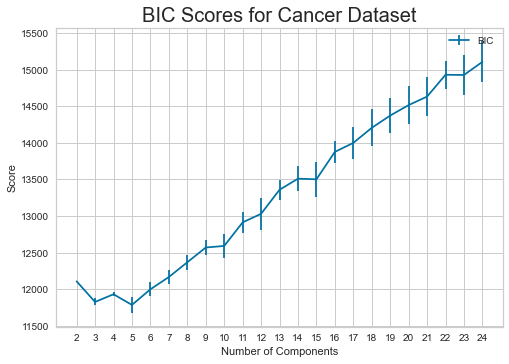

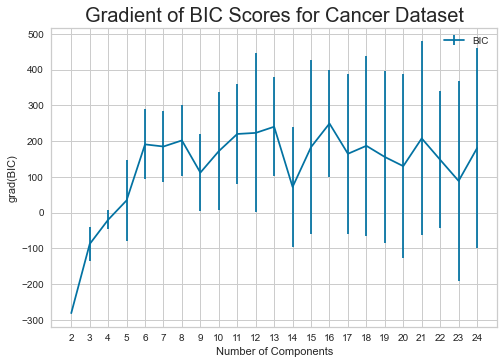

<Figure size 576x396 with 0 Axes>

In [128]:
bic_plot(X_rp, 25, dataset_name = 'Cancer Dataset')


In [150]:
# exp max + SVD - grid dataset
tsvd = TruncatedSVD(n_components=12)
X_tsvd = tsvd.fit_transform(grid_xtrain)
generate_silhouette_score_plot(X_tsvd, 21, GaussianMixture, dataset_name = 'Grid Dataset')


In [ ]:
distance_GMM(X_tsvd, 25, dataset_name = 'Grid Dataset')


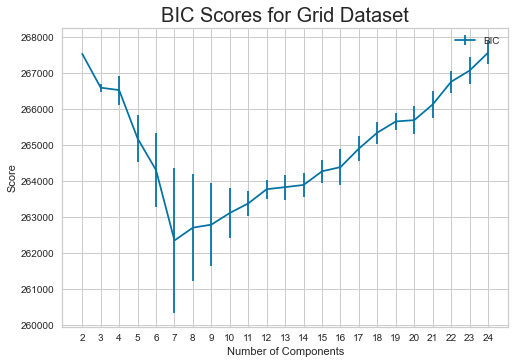

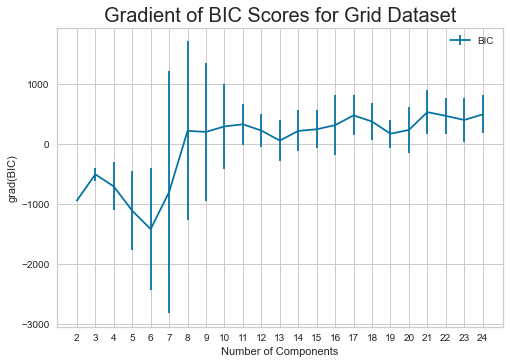

<Figure size 576x396 with 0 Axes>

In [151]:
bic_plot(X_tsvd, 25, dataset_name = 'Grid Dataset')


C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is k

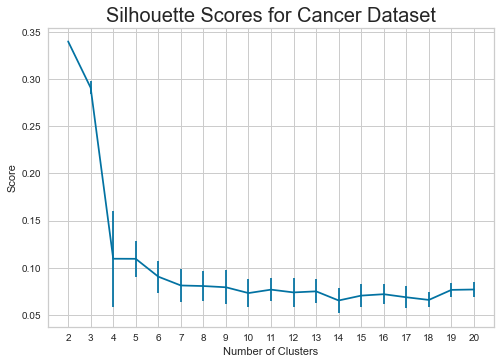

In [152]:
# exp max + SVD - cancer dataset
tsvd = TruncatedSVD(n_components=17)
X_tsvd = tsvd.fit_transform(cancer_xtrain)
generate_silhouette_score_plot(X_tsvd, 21, GaussianMixture, dataset_name = 'Cancer Dataset')


In [ ]:
distance_GMM(X_tsvd, 25, dataset_name = 'Cancer Dataset')


C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is k

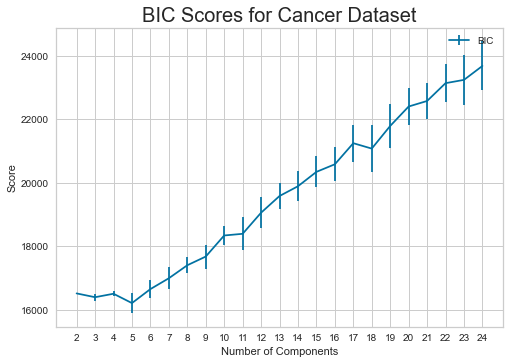

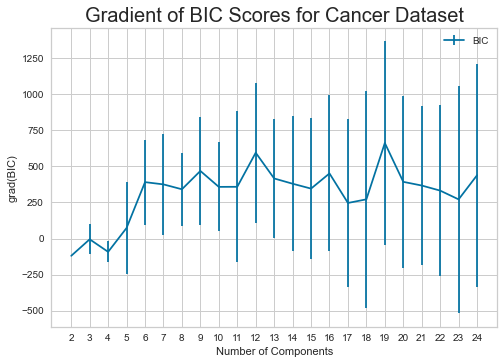

<Figure size 576x396 with 0 Axes>

In [153]:
bic_plot(X_tsvd, 25, dataset_name = 'Cancer Dataset')


## Train/Query Time

In [154]:
# exp max + pca - grid
pca = PCA(n_components= 11).fit(grid_xtrain)
X_pca = pca.transform(grid_xtrain)

start = time.time()
gmm=GaussianMixture(11).fit(X_pca)
train_time = time.time() - start
print("Train time: " + str(train_time))

start = time.time()
gmm.predict(X_pca)
query_time = time.time() - start
print("Query time: " + str(query_time))

Train time: 1.4464125633239746
Query time: 0.009119749069213867


In [155]:
# kmeans + pca - grid

start = time.time()
gmm=KMeans(11).fit(X_pca)
train_time = time.time() - start
print("Train time: " + str(train_time))

start = time.time()
gmm.predict(X_pca)
query_time = time.time() - start
print("Query time: " + str(query_time))

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Train time: 1.9419276714324951
Query time: 0.105194091796875


In [156]:
# exp max + pca - cancer
pca = PCA(n_components= 10).fit(cancer_xtrain)
X_pca = pca.transform(cancer_xtrain)

start = time.time()
gmm=GaussianMixture(11).fit(X_pca)
train_time = time.time() - start
print("Train time: " + str(train_time))

start = time.time()
gmm.predict(X_pca)
query_time = time.time() - start
print("Query time: " + str(query_time))

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


Train time: 0.34844970703125
Query time: 0.0019958019256591797


In [157]:
# kmeans + pca - cancer

start = time.time()
gmm=KMeans(10).fit(X_pca)
train_time = time.time() - start
print("Train time: " + str(train_time))

start = time.time()
gmm.predict(X_pca)
query_time = time.time() - start
print("Query time: " + str(query_time))

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


Train time: 1.1108112335205078
Query time: 0.0959475040435791


In [158]:
# exp max + ica - grid
ica = FastICA(n_components= 2, max_iter=10000, tol=0.1).fit(grid_xtrain)
X_ica = ica.transform(grid_xtrain)

start = time.time()
gmm=GaussianMixture(2).fit(X_ica)
train_time = time.time() - start
print("Train time: " + str(train_time))

start = time.time()
gmm.predict(X_ica)
query_time = time.time() - start
print("Query time: " + str(query_time))

Train time: 0.1594831943511963
Query time: 0.0019960403442382812


In [159]:
# kmeans + ica - grid

start = time.time()
gmm=KMeans(2).fit(X_ica)
train_time = time.time() - start
print("Train time: " + str(train_time))

start = time.time()
gmm.predict(X_ica)
query_time = time.time() - start
print("Query time: " + str(query_time))

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Train time: 1.2602229118347168
Query time: 0.10761833190917969


In [160]:
# exp max + ica - cancer
ica = FastICA(n_components= 29, max_iter=10000, tol=0.1).fit(cancer_xtrain)
X_ica = ica.transform(cancer_xtrain)

start = time.time()
gmm=GaussianMixture(29).fit(X_ica)
train_time = time.time() - start
print("Train time: " + str(train_time))

start = time.time()
gmm.predict(X_ica)
query_time = time.time() - start
print("Query time: " + str(query_time))

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


Train time: 0.3991668224334717
Query time: 0.0031442642211914062


In [161]:
# kmeans + ica - cancer

start = time.time()
gmm=KMeans(29).fit(X_ica)
train_time = time.time() - start
print("Train time: " + str(train_time))

start = time.time()
gmm.predict(X_ica)
query_time = time.time() - start
print("Query time: " + str(query_time))

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


Train time: 1.4001049995422363
Query time: 0.11176323890686035


In [162]:
# exp max + rand proj - grid
rp = random_projection.SparseRandomProjection(n_components=10)
X_rp=rp.fit_transform(grid_xtrain)
start = time.time()
gmm=GaussianMixture(10).fit(X_rp)
train_time = time.time() - start
print("Train time: " + str(train_time))

start = time.time()
gmm.predict(X_rp)
query_time = time.time() - start
print("Query time: " + str(query_time))

Train time: 0.7435522079467773
Query time: 0.007245540618896484


In [163]:
# kmeans + rp - grid

start = time.time()
gmm=KMeans(10).fit(X_rp)
train_time = time.time() - start
print("Train time: " + str(train_time))

start = time.time()
gmm.predict(X_rp)
query_time = time.time() - start
print("Query time: " + str(query_time))

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Train time: 1.5863137245178223
Query time: 0.0994720458984375


In [164]:
# exp max + rand proj - cancer
rp = random_projection.SparseRandomProjection(n_components=10)
X_rp=rp.fit_transform(cancer_xtrain)
start = time.time()
gmm=GaussianMixture(10).fit(X_rp)
train_time = time.time() - start
print("Train time: " + str(train_time))

start = time.time()
gmm.predict(X_rp)
query_time = time.time() - start
print("Query time: " + str(query_time))

Train time: 0.22855925559997559
Query time: 0.00399017333984375


C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


In [165]:
# kmeans + rp - cancer

start = time.time()
gmm=KMeans(10).fit(X_rp)
train_time = time.time() - start
print("Train time: " + str(train_time))

start = time.time()
gmm.predict(X_rp)
query_time = time.time() - start
print("Query time: " + str(query_time))

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


Train time: 1.0564615726470947
Query time: 0.09827780723571777


In [166]:
# exp max + svd - grid

tsvd = TruncatedSVD(n_components=12)
X_tsvd = tsvd.fit_transform(grid_xtrain)
start = time.time()
gmm=GaussianMixture(12).fit(X_tsvd)
train_time = time.time() - start
print("Train time: " + str(train_time))

start = time.time()
gmm.predict(X_tsvd)
query_time = time.time() - start
print("Query time: " + str(query_time))

Train time: 1.225511074066162
Query time: 0.013503074645996094


In [167]:
# kmeans + svd - grid

start = time.time()
gmm=KMeans(12).fit(X_tsvd)
train_time = time.time() - start
print("Train time: " + str(train_time))

start = time.time()
gmm.predict(X_tsvd)
query_time = time.time() - start
print("Query time: " + str(query_time))

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Train time: 1.8046741485595703
Query time: 0.1085202693939209


In [168]:
# exp max + svd - cancer

tsvd = TruncatedSVD(n_components=17)
X_tsvd = tsvd.fit_transform(cancer_xtrain)
start = time.time()
gmm=GaussianMixture(17).fit(X_tsvd)
train_time = time.time() - start
print("Train time: " + str(train_time))

start = time.time()
gmm.predict(X_tsvd)
query_time = time.time() - start
print("Query time: " + str(query_time))

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


Train time: 0.3788156509399414
Query time: 0.0019931793212890625


In [169]:
# kmeans + svd - cancer

start = time.time()
gmm=KMeans(17).fit(X_tsvd)
train_time = time.time() - start
print("Train time: " + str(train_time))

start = time.time()
gmm.predict(X_tsvd)
query_time = time.time() - start
print("Query time: " + str(query_time))

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


Train time: 1.0333709716796875
Query time: 0.11297893524169922


### Part 4: Refit NN from HW 1 with HW 3 Step 2 Dim Red

In [20]:
from sklearn.neural_network import MLPClassifier
from sklearn.random_projection import GaussianRandomProjection

# NN - cancer dataset

# Perform PCA
n_pca_components = 10
pca = PCA(n_components=n_pca_components)
X_pca = pca.fit_transform(cancer_xtrain)

# Perform ICA
n_ica_components = 29
from sklearn.decomposition import FastICA
ica = FastICA(n_components=n_ica_components)
X_ica = ica.fit_transform(cancer_xtrain)

# Perform Random Projection (RP)
n_rp_components = 80
rp = GaussianRandomProjection(n_components=n_rp_components)
X_rp = rp.fit_transform(cancer_xtrain)

# Perform SVD
n_svd_components = 17
from sklearn.decomposition import TruncatedSVD

svd = TruncatedSVD(n_components=n_svd_components)
X_svd = svd.fit_transform(cancer_xtrain)

# Combine reduced components into a single dataset
combined_X = np.hstack((X_pca, X_ica, X_rp, X_svd))

# Train your MLPClassifier on the combined dataset
X_train, X_test, y_train, y_test = train_test_split(combined_X, cancer_ytrain, test_size=0.2, random_state=42)

# Define and train the MLPClassifier
mlp = MLPClassifier(hidden_layer_sizes=(100, 50), max_iter=1000, random_state=42)
mlp.fit(X_train, y_train)



C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\random_projection.py:408: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (30 < 80).The dimensionality of the problem will not be reduced.
  warnings.warn(


MLPClassifier(hidden_layer_sizes=(100, 50), max_iter=1000, random_state=42)

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda

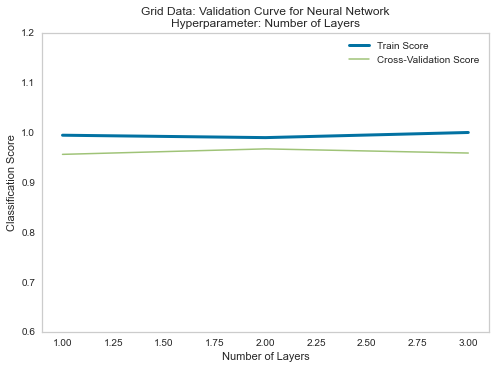

In [21]:
from sklearn.model_selection import validation_curve

# NN: validation curve for number of layers
param_range = [1,2,3]
train_scores, test_scores = validation_curve(mlp, X_train, y_train, param_name='hidden_layer_sizes', param_range=param_range, cv=5)

# plot validation curve
plt.figure()
plt.plot(param_range, np.mean(train_scores, axis=1), label='Train Score', linewidth=3)
plt.plot(param_range, np.mean(test_scores, axis=1), label='Cross-Validation Score', linewidth=1.5)
plt.ylim(0.6,1.2)
plt.title('Grid Data: Validation Curve for Neural Network\nHyperparameter: Number of Layers')
plt.xlabel('Number of Layers')
plt.ylabel('Classification Score')
plt.legend(loc='best')
plt.grid()
plt.show()

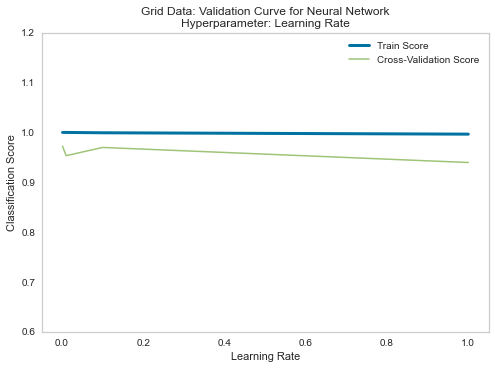

In [22]:
# NN: validation curve for learning rate
param_range = np.logspace(-3,0,4)
train_scores, test_scores = validation_curve(mlp, X_train, y_train, param_name='learning_rate_init', param_range=param_range, cv=5)

# plot validation curve
plt.figure()
plt.plot(param_range, np.mean(train_scores, axis=1), label='Train Score', linewidth=3)
plt.plot(param_range, np.mean(test_scores, axis=1), label='Cross-Validation Score', linewidth=1.5)
plt.ylim(0.6,1.2)
plt.title('Grid Data: Validation Curve for Neural Network\nHyperparameter: Learning Rate')
plt.xlabel('Learning Rate')
plt.ylabel('Classification Score')
plt.legend(loc='best')
plt.grid()
plt.show()

In [23]:
# NN: find best parameters 
from sklearn.model_selection import GridSearchCV

def TreeGridSearch(X_train, y_train):
    param_grid = {'hidden_layer_sizes':[1,2,3], 'learning_rate_init':np.logspace(-3,0,4)}
    NN = GridSearchCV(estimator=MLPClassifier(), param_grid=param_grid, cv=5)
   # t0 = time.time()
    NN.fit(X_train, y_train)
    #t1 = time.time()
    #train_time[0] = t1 - t0
    #print('Completed training in %f seconds' % train_time[0])
    print('Per hyperparameter training, the best parameters are:', NN.best_params_)
    #y_pred = NN.predict(y_train)
    return NN.best_params_['hidden_layer_sizes'], NN.best_params_['learning_rate_init']

hidden_layer_sizes, learning_rate_init = TreeGridSearch(X_train, y_train)

#print('Accuracy of the Neural Network is:', accuracy_score(y_test, y_pred)*100, '%.')

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\li

Per hyperparameter training, the best parameters are: {'hidden_layer_sizes': 3, 'learning_rate_init': 0.001}


C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


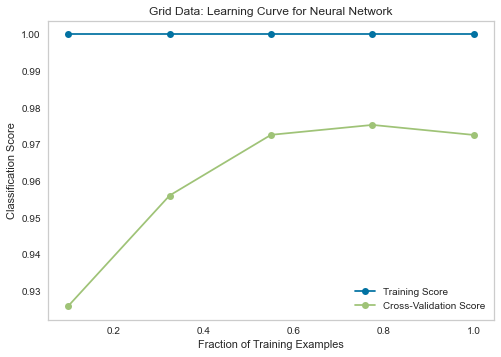

In [24]:
# NN: plot learning curve
from sklearn.model_selection import learning_curve

train_sizes = np.linspace(0.1, 1.0, 5)
_, train_scores, test_scores = learning_curve(mlp, X_train, y_train, train_sizes=train_sizes, cv=5)

plt.figure()
plt.plot(train_sizes, np.mean(train_scores, axis=1), 'o-', label='Training Score')
plt.plot(train_sizes, np.mean(test_scores, axis=1), 'o-', label='Cross-Validation Score')
plt.title('Grid Data: Learning Curve for Neural Network')
plt.xlabel('Fraction of Training Examples')
plt.ylabel('Classification Score')
plt.legend(loc='best')
plt.grid()
plt.show()

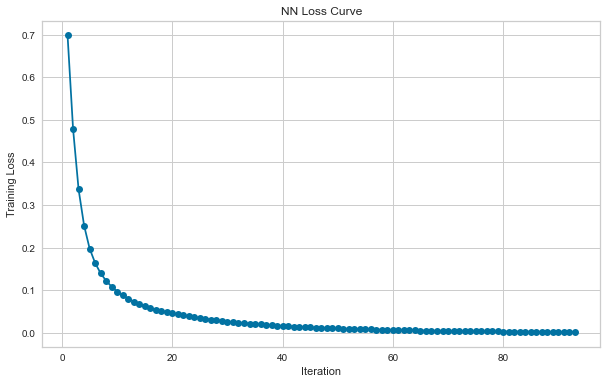

In [25]:
import matplotlib.pyplot as plt
from sklearn.neural_network import MLPClassifier

# get loss curve
loss_curve = mlp.loss_curve_

# Plot the loss curve
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(loss_curve) + 1), loss_curve, marker='o', linestyle='-')
plt.title('NN Loss Curve')
plt.xlabel('Iteration')
plt.ylabel('Training Loss')
plt.grid(True)
plt.show()


In [27]:
# evaluate decision tree model on test dataset
# set optimal layer + learning rate values 
from sklearn.metrics import roc_auc_score, accuracy_score, f1_score, precision_score, recall_score, confusion_matrix
import timeit
def evaluate_test(classifier, X_train, X_test, y_train, y_test):
    
    start_time = timeit.default_timer()
    classifier.fit(X_train, y_train)
    end_time = timeit.default_timer()
    training_time = end_time - start_time
    
    start_time = timeit.default_timer()    
    y_pred = classifier.predict(X_test)
    end_time = timeit.default_timer()
    pred_time = end_time - start_time
    
    auc = roc_auc_score(y_test, y_pred)
    f1 = f1_score(y_test,y_pred)
    accuracy = accuracy_score(y_test,y_pred)
    precision = precision_score(y_test,y_pred)
    recall = recall_score(y_test,y_pred)
    #cm = confusion_matrix(y_test,y_pred)

    print("Evaluation Metrics for Test Dataset")
    print("*****************************************************")
    print("Model Training Time (s):   "+"{:.5f}".format(training_time))
    print("Model Prediction Time (s): "+"{:.5f}\n".format(pred_time))
    print("F1 Score:  "+"{:.2f}".format(f1))
    print("Accuracy:  "+"{:.2f}".format(accuracy)+"     AUC:       "+"{:.2f}".format(auc))
    print("Precision: "+"{:.2f}".format(precision)+"     Recall:    "+"{:.2f}".format(recall))
    print("*****************************************************")
    
NN_best = MLPClassifier(hidden_layer_sizes = 3, learning_rate_init = 0.001, random_state = 0)
evaluate_test(NN_best, X_train, X_test, y_train, y_test)


Evaluation Metrics for Test Dataset
*****************************************************
Model Training Time (s):   0.39155
Model Prediction Time (s): 0.00135

F1 Score:  0.00
Accuracy:  0.42     AUC:       0.50
Precision: 0.00     Recall:    0.00
*****************************************************


C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### Part 5: Refit NN from HW 1 on input space from HW 3 Part 1 

In [187]:

# Perform Expectation Maximization (EM)
n_em_clusters = 3   
em = GaussianMixture(n_components=n_em_clusters)
em_labels = em.fit_predict(cancer_xtrain)

# Perform K-means clustering
n_kmeans_clusters = 3  
kmeans = KMeans(n_clusters=n_kmeans_clusters)
kmeans_labels = kmeans.fit_predict(cancer_xtrain)

# Combine the cluster labels as features for your new input space
new_input_space = np.column_stack((em_labels, kmeans_labels))

# Step 3: Train your MLPClassifier on the new input space
X_train, X_test, y_train, y_test = train_test_split(new_input_space, cancer_ytrain, test_size=0.2, random_state=42)

# Define and train the MLPClassifier
mlp = MLPClassifier(hidden_layer_sizes=(100, 50), max_iter=1000, random_state=42)
mlp.fit(X_train, y_train)

# Evaluate your MLPClassifier on the test set, make predictions, etc.
# You can use various evaluation metrics as needed.


C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


MLPClassifier(hidden_layer_sizes=(100, 50), max_iter=1000, random_state=42)

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda

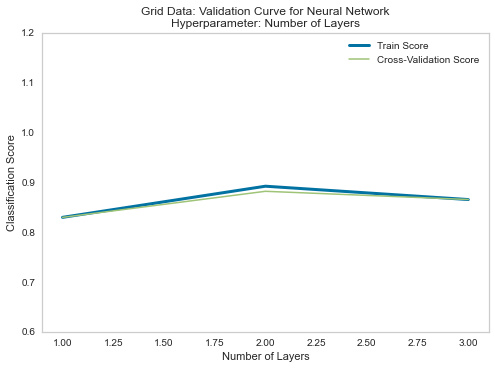

In [188]:
from sklearn.model_selection import validation_curve

# NN: validation curve for number of layers
param_range = [1,2,3]
train_scores, test_scores = validation_curve(mlp, X_train, y_train, param_name='hidden_layer_sizes', param_range=param_range, cv=5)

# plot validation curve
plt.figure()
plt.plot(param_range, np.mean(train_scores, axis=1), label='Train Score', linewidth=3)
plt.plot(param_range, np.mean(test_scores, axis=1), label='Cross-Validation Score', linewidth=1.5)
plt.ylim(0.6,1.2)
plt.title('Grid Data: Validation Curve for Neural Network\nHyperparameter: Number of Layers')
plt.xlabel('Number of Layers')
plt.ylabel('Classification Score')
plt.legend(loc='best')
plt.grid()
plt.show()

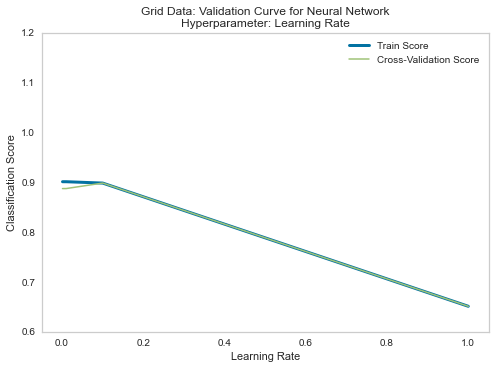

In [189]:
# NN: validation curve for learning rate
param_range = np.logspace(-3,0,4)
train_scores, test_scores = validation_curve(mlp, X_train, y_train, param_name='learning_rate_init', param_range=param_range, cv=5)

# plot validation curve
plt.figure()
plt.plot(param_range, np.mean(train_scores, axis=1), label='Train Score', linewidth=3)
plt.plot(param_range, np.mean(test_scores, axis=1), label='Cross-Validation Score', linewidth=1.5)
plt.ylim(0.6,1.2)
plt.title('Grid Data: Validation Curve for Neural Network\nHyperparameter: Learning Rate')
plt.xlabel('Learning Rate')
plt.ylabel('Classification Score')
plt.legend(loc='best')
plt.grid()
plt.show()

In [190]:
# NN: find best parameters 
from sklearn.model_selection import GridSearchCV

def TreeGridSearch(X_train, y_train):
    param_grid = {'hidden_layer_sizes':[1,2,3], 'learning_rate_init':np.logspace(-3,0,4)}
    NN = GridSearchCV(estimator=MLPClassifier(), param_grid=param_grid, cv=5)
   # t0 = time.time()
    NN.fit(X_train, y_train)
    #t1 = time.time()
    #train_time[0] = t1 - t0
    #print('Completed training in %f seconds' % train_time[0])
    print('Per hyperparameter training, the best parameters are:', NN.best_params_)
    #y_pred = NN.predict(y_train)
    return NN.best_params_['hidden_layer_sizes'], NN.best_params_['learning_rate_init']

hidden_layer_sizes, learning_rate_init = TreeGridSearch(X_train, y_train)

#print('Accuracy of the Neural Network is:', accuracy_score(y_test, y_pred)*100, '%.')

C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\Amulya Cherian\anaconda3\li

Per hyperparameter training, the best parameters are: {'hidden_layer_sizes': 2, 'learning_rate_init': 0.01}


C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


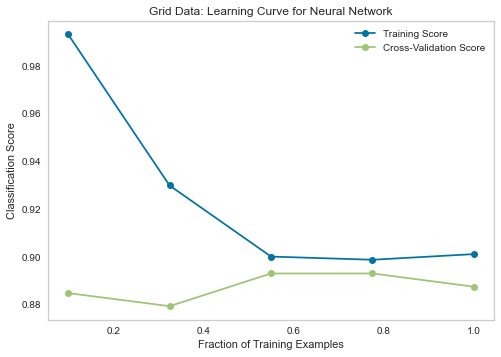

In [191]:
# NN: plot learning curve
from sklearn.model_selection import learning_curve

train_sizes = np.linspace(0.1, 1.0, 5)
_, train_scores, test_scores = learning_curve(mlp, X_train, y_train, train_sizes=train_sizes, cv=5)

plt.figure()
plt.plot(train_sizes, np.mean(train_scores, axis=1), 'o-', label='Training Score')
plt.plot(train_sizes, np.mean(test_scores, axis=1), 'o-', label='Cross-Validation Score')
plt.title('Grid Data: Learning Curve for Neural Network')
plt.xlabel('Fraction of Training Examples')
plt.ylabel('Classification Score')
plt.legend(loc='best')
plt.grid()
plt.show()

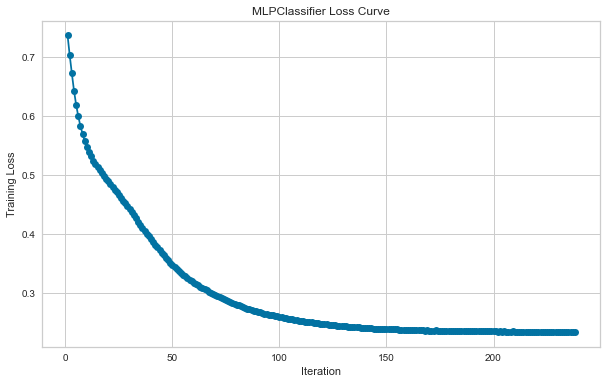

In [192]:
import matplotlib.pyplot as plt
from sklearn.neural_network import MLPClassifier

# get loss curve
loss_curve = mlp.loss_curve_

# Plot the loss curve
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(loss_curve) + 1), loss_curve, marker='o', linestyle='-')
plt.title('MLPClassifier Loss Curve')
plt.xlabel('Iteration')
plt.ylabel('Training Loss')
plt.grid(True)
plt.show()


In [194]:
# evaluate decision tree model on test dataset
# set optimal layer + learning rate values 
from sklearn.metrics import roc_auc_score, accuracy_score, f1_score, precision_score, recall_score, confusion_matrix
import timeit
def evaluate_test(classifier, X_train, X_test, y_train, y_test):
    
    start_time = timeit.default_timer()
    classifier.fit(X_train, y_train)
    end_time = timeit.default_timer()
    training_time = end_time - start_time
    
    start_time = timeit.default_timer()    
    y_pred = classifier.predict(X_test)
    end_time = timeit.default_timer()
    pred_time = end_time - start_time
    
    auc = roc_auc_score(y_test, y_pred)
    f1 = f1_score(y_test,y_pred)
    accuracy = accuracy_score(y_test,y_pred)
    precision = precision_score(y_test,y_pred)
    recall = recall_score(y_test,y_pred)
    #cm = confusion_matrix(y_test,y_pred)

    print("Evaluation Metrics for Test Dataset")
    print("*****************************************************")
    print("Model Training Time (s):   "+"{:.5f}".format(training_time))
    print("Model Prediction Time (s): "+"{:.5f}\n".format(pred_time))
    print("F1 Score:  "+"{:.2f}".format(f1))
    print("Accuracy:  "+"{:.2f}".format(accuracy)+"     AUC:       "+"{:.2f}".format(auc))
    print("Precision: "+"{:.2f}".format(precision)+"     Recall:    "+"{:.2f}".format(recall))
    print("*****************************************************")
    
NN_best = MLPClassifier(hidden_layer_sizes = 2, learning_rate_init = 0.01, random_state = 0)
evaluate_test(NN_best, X_train, X_test, y_train, y_test)


Evaluation Metrics for Test Dataset
*****************************************************
Model Training Time (s):   0.20003
Model Prediction Time (s): 0.00049

F1 Score:  0.93
Accuracy:  0.92     AUC:       0.93
Precision: 0.96     Recall:    0.91
*****************************************************


C:\Users\Amulya Cherian\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
